File for Data Cleaning and Initial Plotting of Variables

# PPOL 5203 Final Project

## 1. Import Data and Clean Columns

In [3]:
#!pip install openpyxl

import pandas as pd
import os
import openpyxl

In [17]:
#changing path so that we can open files from the orig_data folder
#KL: when i re-run code i keep getting errors when we start to switch directories. Can we work from the main 
#final project folder and code the file paths from there?



os.chdir("../")
#os.chdir('Datasets/Orig_Data')
#os.chdir('PPOL5203_FinalProject')

In [23]:
# import County Health Data

countyhealthcols_1 = ['FIPS', 'State', 'County', 'Life Expectancy', 'Age-Adjusted Death Rate', '% Frequent Physical Distress', '% Frequent Mental Distress', 
                 '% Less than 18 Years of Age','% 65 and Over','% Non-Hispanic White','% Female','% Rural']

County_Health_xl = pd.read_excel("2023_County_Health_Rankings_Data.xlsx", sheet_name = ['Additional Measure Data'],skiprows = 1, usecols = countyhealthcols_1)

In [ ]:
# subset the dictionary provided by the sheet needed and save as a new dataframe
County_Health_Addl_Measures = County_Health_xl['Additional Measure Data']

In [ ]:
County_Health_Addl_Measures.rename(columns=lambda x: x.replace(" ", "_").replace("%", "Percent"), inplace=True)

County_Health_Addl_Measures.head()

In [28]:
countyhealthcols_2 = ['FIPS','% Fair or Poor Health', 'Average Number of Physically Unhealthy Days', 'Average Number of Mentally Unhealthy Days', '# Primary Care Physicians','Primary Care Physicians Rate',
                 'Primary Care Physicians Ratio', '# Dentists', 'Dentist Rate','Dentist Ratio', 'Average Daily PM2.5', 'Presence of Water Violation', '# Mental Health Providers','Mental Health Provider Rate','Mental Health Provider Ratio']

County_Health_xl_ranked_data = pd.read_excel("/PPOL5203_FinalProject/Datasets/Orig_Data/2023_County_Health_Rankings_Data.xlsx", sheet_name = ['Ranked Measure Data'],skiprows = 1, usecols = countyhealthcols_2)

In [29]:
# subset the dictionary provided by the sheet needed and save as a new dataframe
County_Health_Ranked_Measures = County_Health_xl_ranked_data['Ranked Measure Data']

In [30]:
# clean column names
County_Health_Ranked_Measures.rename(columns=lambda x: x.replace(" ", "_").replace("%", "Percent").replace("#", "Number"), inplace=True)

# Do we want to convert percents to decimals?
# Do we want the ratios for dentist, primary care, mental health? 

County_Health_Ranked_Measures.head()

,FIPS,Percent_Fair_or_Poor_Health,Average_Number_of_Physically_Unhealthy_Days,Average_Number_of_Mentally_Unhealthy_Days,Number_Primary_Care_Physicians,Primary_Care_Physicians_Rate,Primary_Care_Physicians_Ratio,Number_Dentists,Dentist_Rate,Dentist_Ratio,Number_Mental_Health_Providers,Mental_Health_Provider_Rate,Mental_Health_Provider_Ratio,Average_Daily_PM2.5,Presence_of_Water_Violation
0,1000,18.9,3.482416,5.073277,3238.0,65.79252,1520:1,2454.0,48.69166,2054:1,6321.0,125.41973,797:1,9.3,NaN
1,1001,16.9,3.432211,4.797351,25.0,44.52756,2246:1,19.0,32.15162,3110:1,21.0,35.53600,2814:1,10.0,No
2,1003,14.9,3.276177,4.753750,150.0,65.42019,1529:1,114.0,47.64014,2099:1,250.0,104.47399,957:1,7.6,Yes
3,1005,27.5,4.605432,4.954855,8.0,32.53487,3074:1,8.0,32.04615,3121:1,6.0,24.03461,4161:1,9.4,Yes
4,1007,21.6,4.012182,5.364779,14.0,63.24539,1581:1,6.0,26.69395,3746:1,9.0,40.04093,2497:1,9.8,No


In [35]:
#import NRI data 

NRIcols = ['STATEABBRV','STCOFIPS', 'POPULATION','AREA',
           'RISK_SCORE','RISK_RATNG','EAL_SCORE','EAL_RATNG','SOVI_SCORE','SOVI_RATNG','RESL_SCORE','RESL_RATNG']

NRI_df = pd.read_csv("/PPOL5203_FinalProject/Datasets/Orig_Data/NRI_Table_Counties/NRI_Table_Counties.csv", usecols = NRIcols)

NRI_df.rename(columns = {'STCOFIPS': 'FIPS'}, inplace = True)

NRI_df.head()

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,RESL_SCORE,RESL_RATNG
0,AL,1001,58764,610.470508,49.220490,Relatively Low,50.943980,Very Low,51.299999,Relatively Moderate,51.810001,Relatively Moderate
1,AL,1003,231365,2047.738775,97.709195,Relatively High,98.235840,Relatively High,31.030001,Relatively Low,86.120003,Very High
2,AL,1005,25160,913.646511,56.188355,Relatively Low,44.877747,Very Low,99.269997,Very High,6.240000,Very Low
3,AL,1007,22239,632.486798,32.484887,Very Low,30.485918,Very Low,80.779999,Very High,19.730000,Very Low
4,AL,1009,58992,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,51.369999,Relatively Moderate,22.820000,Relatively Low


In [37]:
#os.chdir('../')

pwd

In [39]:
#import Places data 

PlacesCols = ['StateAbbr', 'StateDesc', 'LocationName', 'LocationID', 'Geolocation']


Places_df = pd.read_csv("/PPOL5203_FinalProject/Datasets/Orig_Data/PLACES__Local_Data_for_Better_Health__County_Data_2023_release.csv", usecols = PlacesCols)


#I moved this code later on so that it is in the final dataset
#Places_df['County_State'] = Places_df.LocationName + ", " + Places_df.StateAbbr

Places_df.head()

,StateAbbr,StateDesc,LocationName,LocationID,Geolocation
0,GA,Georgia,Ware,13299,POINT (-82.4215072 31.050881)
1,IN,Indiana,Ohio,18115,POINT (-84.9642994 38.940527)
2,IN,Indiana,Owen,18119,POINT (-86.8388453 39.3173394)
3,IA,Iowa,Iowa,19095,POINT (-92.0591226 41.6839184)
4,IA,Iowa,Marion,19125,POINT (-93.0938678 41.3314327)


In [40]:
# Create a new column for the county and state so that we can merge later
# Confirm - this data set does not include FIPS?
#KL -changing group to group by the FIPS (in this case called LocationID)
Places_df_grouped = pd.DataFrame(Places_df.groupby('LocationID', as_index = False)['Geolocation'].first())
Places_df_grouped.head()

,LocationID,Geolocation
0,59,None
1,1001,POINT (-86.6464395 32.5322367)
2,1003,POINT (-87.7460666 30.6592183)
3,1005,POINT (-85.4051035 31.8702531)
4,1007,POINT (-87.1271475 33.0158929)


## 2. Merge Datasets together by FIPS

In [42]:
# To see which data set has the most information on FIPS

print( NRI_df.shape)
print( County_Health_Ranked_Measures.shape)
print( County_Health_Addl_Measures.shape)
print( Places_df_grouped.shape)

# Do we want to join on the left or outer? Outer would mean that we don't have data for NRI for those FIPS that are coming from the county health data

(3231, 12)
(3193, 15)
(3193, 12)
(3144, 2)


In [43]:
Merged_County_Data_Ranked = pd.merge(NRI_df, County_Health_Ranked_Measures, how = 'left', on = 'FIPS')

Merged_County_Data_Ranked.shape

Merged_County_Data_Ranked.head()

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Primary_Care_Physicians_Rate,Primary_Care_Physicians_Ratio,Number_Dentists,Dentist_Rate,Dentist_Ratio,Number_Mental_Health_Providers,Mental_Health_Provider_Rate,Mental_Health_Provider_Ratio,Average_Daily_PM2.5,Presence_of_Water_Violation
0,AL,1001,58764,610.470508,49.220490,Relatively Low,50.943980,Very Low,51.299999,Relatively Moderate,...,44.52756,2246:1,19.0,32.15162,3110:1,21.0,35.53600,2814:1,10.0,No
1,AL,1003,231365,2047.738775,97.709195,Relatively High,98.235840,Relatively High,31.030001,Relatively Low,...,65.42019,1529:1,114.0,47.64014,2099:1,250.0,104.47399,957:1,7.6,Yes
2,AL,1005,25160,913.646511,56.188355,Relatively Low,44.877747,Very Low,99.269997,Very High,...,32.53487,3074:1,8.0,32.04615,3121:1,6.0,24.03461,4161:1,9.4,Yes
3,AL,1007,22239,632.486798,32.484887,Very Low,30.485918,Very Low,80.779999,Very High,...,63.24539,1581:1,6.0,26.69395,3746:1,9.0,40.04093,2497:1,9.8,No
4,AL,1009,58992,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,51.369999,Relatively Moderate,...,20.73291,4823:1,10.0,16.93738,5904:1,12.0,20.32486,4920:1,9.6,No


In [44]:
Merged_County_Data2 = pd.merge(NRI_df, County_Health_Ranked_Measures, how = 'outer', on = 'FIPS')
Merged_County_Data2.shape

# going with the left join for now

(3283, 26)

In [45]:
#merge the additional measures with the previously merged data set
Merged_County_Data_Addl_Measures = pd.merge(Merged_County_Data_Ranked, County_Health_Addl_Measures, how = 'left', on = 'FIPS')
Merged_County_Data_Addl_Measures.shape

Merged_County_Data = pd.merge(Merged_County_Data_Addl_Measures,
         Places_df_grouped,
         how="outer",
         left_on = "FIPS",  
         right_on="LocationID")

Merged_County_Data.head()

#print(Merged_County_Data.shape)

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Age-Adjusted_Death_Rate,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non-Hispanic_White,Percent_Female,Percent_Rural,LocationID,Geolocation
0,AL,1001.0,58764.0,610.470508,49.220490,Relatively Low,50.943980,Very Low,51.299999,Relatively Moderate,...,427.073326,10.7,16.2,23.406380,16.048735,72.454522,51.378289,42.002162,1001.0,POINT (-86.6464395 32.5322367)
1,AL,1003.0,231365.0,2047.738775,97.709195,Relatively High,98.235840,Relatively High,31.030001,Relatively Low,...,381.702031,9.9,16.1,21.218250,21.469824,83.148763,51.347715,42.279099,1003.0,POINT (-87.7460666 30.6592183)
2,AL,1005.0,25160.0,913.646511,56.188355,Relatively Low,44.877747,Very Low,99.269997,Very High,...,589.566095,14.9,18.0,20.549591,19.976767,45.305240,46.703253,67.789635,1005.0,POINT (-85.4051035 31.8702531)
3,AL,1007.0,22239.0,632.486798,32.484887,Very Low,30.485918,Very Low,80.779999,Very High,...,567.508146,12.7,17.4,20.118343,16.737109,73.564088,46.015927,68.352607,1007.0,POINT (-87.1271475 33.0158929)
4,AL,1009.0,58992.0,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,51.369999,Relatively Moderate,...,532.836482,11.9,17.4,23.053471,18.725970,86.329839,50.192239,89.951502,1009.0,POINT (-86.56644 33.9773575)


In [46]:
# create new column for County_State so that we can merge with the Places data set
#Merged_County_Data_Addl_Measures['County_State'] = Merged_County_Data_Addl_Measures['COUNTY'] + ", " + Merged_County_Data_Addl_Measures['STATEABBRV']

In [47]:
# merge the places data set with the rest of the data on the County_state variable
#Merged_County_Data = pd.merge(Merged_County_Data_Addl_Measures, Places_df_grouped, how = 'left', on = 'County_State')

Merged_County_Data['County_State'] = Merged_County_Data.County + ", " + Merged_County_Data.STATEABBRV

Merged_County_Data.head()

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non-Hispanic_White,Percent_Female,Percent_Rural,LocationID,Geolocation,County_State
0,AL,1001.0,58764.0,610.470508,49.220490,Relatively Low,50.943980,Very Low,51.299999,Relatively Moderate,...,10.7,16.2,23.406380,16.048735,72.454522,51.378289,42.002162,1001.0,POINT (-86.6464395 32.5322367),"Autauga, AL"
1,AL,1003.0,231365.0,2047.738775,97.709195,Relatively High,98.235840,Relatively High,31.030001,Relatively Low,...,9.9,16.1,21.218250,21.469824,83.148763,51.347715,42.279099,1003.0,POINT (-87.7460666 30.6592183),"Baldwin, AL"
2,AL,1005.0,25160.0,913.646511,56.188355,Relatively Low,44.877747,Very Low,99.269997,Very High,...,14.9,18.0,20.549591,19.976767,45.305240,46.703253,67.789635,1005.0,POINT (-85.4051035 31.8702531),"Barbour, AL"
3,AL,1007.0,22239.0,632.486798,32.484887,Very Low,30.485918,Very Low,80.779999,Very High,...,12.7,17.4,20.118343,16.737109,73.564088,46.015927,68.352607,1007.0,POINT (-87.1271475 33.0158929),"Bibb, AL"
4,AL,1009.0,58992.0,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,51.369999,Relatively Moderate,...,11.9,17.4,23.053471,18.725970,86.329839,50.192239,89.951502,1009.0,POINT (-86.56644 33.9773575),"Blount, AL"


In [48]:
Merged_County_Data.County.isna().value_counts()

County
False    3141
True       91
Name: count, dtype: int64

In [49]:
Merged_County_Data[Merged_County_Data.County.isna()]

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non-Hispanic_White,Percent_Female,Percent_Rural,LocationID,Geolocation,County_State
72,AK,2063.0,7011.0,15296.227862,8.017817,Very Low,9.068400,Very Low,23.520000,Relatively Low,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2063.0,POINT (-146.2030924 60.4884737),NaN
73,AK,2066.0,2596.0,25416.208556,2.036271,Very Low,1.578459,Very Low,41.790001,Relatively Moderate,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2066.0,POINT (-143.9221674 62.034479),NaN
3143,AS,60010.0,17658.0,161.791322,NaN,Insufficient Data,17.146394,Very Low,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3144,AS,60020.0,852.0,203.525024,NaN,Insufficient Data,0.247601,Very Low,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3145,AS,60050.0,31217.0,104.997645,NaN,Insufficient Data,31.816775,Very Low,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3227,PR,72153.0,34151.0,69.028903,NaN,Insufficient Data,81.739400,Relatively Low,85.959999,Very High,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3228,VI,78010.0,40913.0,336.008335,NaN,Insufficient Data,88.300836,Relatively Moderate,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3229,VI,78020.0,3882.0,92.690701,NaN,Insufficient Data,48.529867,Very Low,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3230,VI,78030.0,41412.0,311.621622,NaN,Insufficient Data,90.095946,Relatively Moderate,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [50]:
Merged_County_Data.State.isna().value_counts()

State
False    3141
True       91
Name: count, dtype: int64

In [51]:
Merged_County_Data[Merged_County_Data.STATEABBRV == "AL"]

# Remove duplicate state and county columns
Merged_County_Data.drop(columns = ['LocationID'], inplace = True)

Merged_County_Data.head()

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Age-Adjusted_Death_Rate,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non-Hispanic_White,Percent_Female,Percent_Rural,Geolocation,County_State
0,AL,1001.0,58764.0,610.470508,49.220490,Relatively Low,50.943980,Very Low,51.299999,Relatively Moderate,...,427.073326,10.7,16.2,23.406380,16.048735,72.454522,51.378289,42.002162,POINT (-86.6464395 32.5322367),"Autauga, AL"
1,AL,1003.0,231365.0,2047.738775,97.709195,Relatively High,98.235840,Relatively High,31.030001,Relatively Low,...,381.702031,9.9,16.1,21.218250,21.469824,83.148763,51.347715,42.279099,POINT (-87.7460666 30.6592183),"Baldwin, AL"
2,AL,1005.0,25160.0,913.646511,56.188355,Relatively Low,44.877747,Very Low,99.269997,Very High,...,589.566095,14.9,18.0,20.549591,19.976767,45.305240,46.703253,67.789635,POINT (-85.4051035 31.8702531),"Barbour, AL"
3,AL,1007.0,22239.0,632.486798,32.484887,Very Low,30.485918,Very Low,80.779999,Very High,...,567.508146,12.7,17.4,20.118343,16.737109,73.564088,46.015927,68.352607,POINT (-87.1271475 33.0158929),"Bibb, AL"
4,AL,1009.0,58992.0,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,51.369999,Relatively Moderate,...,532.836482,11.9,17.4,23.053471,18.725970,86.329839,50.192239,89.951502,POINT (-86.56644 33.9773575),"Blount, AL"


In [52]:
# create function to classify community type by population of county
# these thresholds come from the CDC urban rural classification report.

def community_type_classification(population):
    '''
    Add description here.
    '''
    if population < 50000:
        return("Rural")
    elif population < 250000:
        return("Small Urban")
    else:
        return("Urban")

In [53]:
# create new column to get community type from the created classification function
Merged_County_Data['Community_Type'] = [community_type_classification(x) for x in Merged_County_Data['POPULATION']]

In [54]:
Merged_County_Data.Community_Type.value_counts()

# Looks like we don't have many urban observations - do we want to include medium in the urban classification?

#KL - if we do cutoff for urban as greater than 250,000 its roughly 250 for urban and 700 for small urban

Community_Type
Rural          2227
Small Urban     726
Urban           279
Name: count, dtype: int64

In [55]:
# Look at the number of NA geolocation rows
Merged_County_Data.Geolocation.isna().value_counts() #only 89 values that don't have geolocations - could be misspellings that we need to look at?

Geolocation
False    3143
True       89
Name: count, dtype: int64

In [56]:
#KL - those with NaN's in the geolocation are US territories -- we can probably remove from the dataset as there is also little information about them in the NRI
Merged_County_Data[Merged_County_Data.Geolocation.isna()]

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non-Hispanic_White,Percent_Female,Percent_Rural,Geolocation,County_State,Community_Type
3143,AS,60010.0,17658.0,161.791322,NaN,Insufficient Data,17.146394,Very Low,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rural
3144,AS,60020.0,852.0,203.525024,NaN,Insufficient Data,0.247601,Very Low,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rural
3145,AS,60050.0,31217.0,104.997645,NaN,Insufficient Data,31.816775,Very Low,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rural
3146,GU,66010.0,153310.0,576.378387,NaN,Insufficient Data,94.150418,Relatively Moderate,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Small Urban
3147,MP,69100.0,1872.0,243.433941,NaN,Insufficient Data,5.911483,Very Low,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rural
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3227,PR,72153.0,34151.0,69.028903,NaN,Insufficient Data,81.739400,Relatively Low,85.959999,Very High,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rural
3228,VI,78010.0,40913.0,336.008335,NaN,Insufficient Data,88.300836,Relatively Moderate,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rural
3229,VI,78020.0,3882.0,92.690701,NaN,Insufficient Data,48.529867,Very Low,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rural
3230,VI,78030.0,41412.0,311.621622,NaN,Insufficient Data,90.095946,Relatively Moderate,NaN,Data Unavailable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rural


In [57]:
#removing NaNs for geolocation
Merged_County_Data_clean = Merged_County_Data[Merged_County_Data.Geolocation.isna() == False]

Merged_County_Data_clean.Geolocation.isna().value_counts()

Geolocation
False    3143
Name: count, dtype: int64

In [58]:
#confirming that all of the remaining datasets have information on NRI risk 
#Merged_County_Data_clean.RISK_RATNG.value_counts()

In [59]:
# Final data set merged all data sets
Merged_County_Data.columns

Index(['STATEABBRV', 'FIPS', 'POPULATION', 'AREA', 'RISK_SCORE', 'RISK_RATNG',
       'EAL_SCORE', 'EAL_RATNG', 'SOVI_SCORE', 'SOVI_RATNG', 'RESL_SCORE',
       'RESL_RATNG', 'Percent_Fair_or_Poor_Health',
       'Average_Number_of_Physically_Unhealthy_Days',
       'Average_Number_of_Mentally_Unhealthy_Days',
       'Number_Primary_Care_Physicians', 'Primary_Care_Physicians_Rate',
       'Primary_Care_Physicians_Ratio', 'Number_Dentists', 'Dentist_Rate',
       'Dentist_Ratio', 'Number_Mental_Health_Providers',
       'Mental_Health_Provider_Rate', 'Mental_Health_Provider_Ratio',
       'Average_Daily_PM2.5', 'Presence_of_Water_Violation', 'State', 'County',
       'Life_Expectancy', 'Age-Adjusted_Death_Rate',
       'Percent_Frequent_Physical_Distress',
       'Percent_Frequent_Mental_Distress', 'Percent_Less_than_18_Years_of_Age',
       'Percent_65_and_Over', 'Percent_Non-Hispanic_White', 'Percent_Female',
       'Percent_Rural', 'Geolocation', 'County_State', 'Community_Type'],
  

In [60]:
# create density column
Merged_County_Data_clean['Population_Density'] = Merged_County_Data_clean['POPULATION'] / Merged_County_Data_clean['AREA']

Merged_County_Data_clean.head()

/var/folders/yd/j7sjh_9n0l7b3715t4x1f8yh0000gn/T/ipykernel_25736/2988376501.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Merged_County_Data_clean['Population_Density'] = Merged_County_Data_clean['POPULATION'] / Merged_County_Data_clean['AREA']


,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non-Hispanic_White,Percent_Female,Percent_Rural,Geolocation,County_State,Community_Type,Population_Density
0,AL,1001.0,58764.0,610.470508,49.220490,Relatively Low,50.943980,Very Low,51.299999,Relatively Moderate,...,16.2,23.406380,16.048735,72.454522,51.378289,42.002162,POINT (-86.6464395 32.5322367),"Autauga, AL",Small Urban,96.260178
1,AL,1003.0,231365.0,2047.738775,97.709195,Relatively High,98.235840,Relatively High,31.030001,Relatively Low,...,16.1,21.218250,21.469824,83.148763,51.347715,42.279099,POINT (-87.7460666 30.6592183),"Baldwin, AL",Small Urban,112.985603
2,AL,1005.0,25160.0,913.646511,56.188355,Relatively Low,44.877747,Very Low,99.269997,Very High,...,18.0,20.549591,19.976767,45.305240,46.703253,67.789635,POINT (-85.4051035 31.8702531),"Barbour, AL",Rural,27.538003
3,AL,1007.0,22239.0,632.486798,32.484887,Very Low,30.485918,Very Low,80.779999,Very High,...,17.4,20.118343,16.737109,73.564088,46.015927,68.352607,POINT (-87.1271475 33.0158929),"Bibb, AL",Rural,35.161208
4,AL,1009.0,58992.0,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,51.369999,Relatively Moderate,...,17.4,23.053471,18.725970,86.329839,50.192239,89.951502,POINT (-86.56644 33.9773575),"Blount, AL",Small Urban,89.763100


## 3. Exploratory Scatterplots

In [63]:
import numpy as np
from plotnine import * # to imitate ggplot
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 91 rows containing missing values.


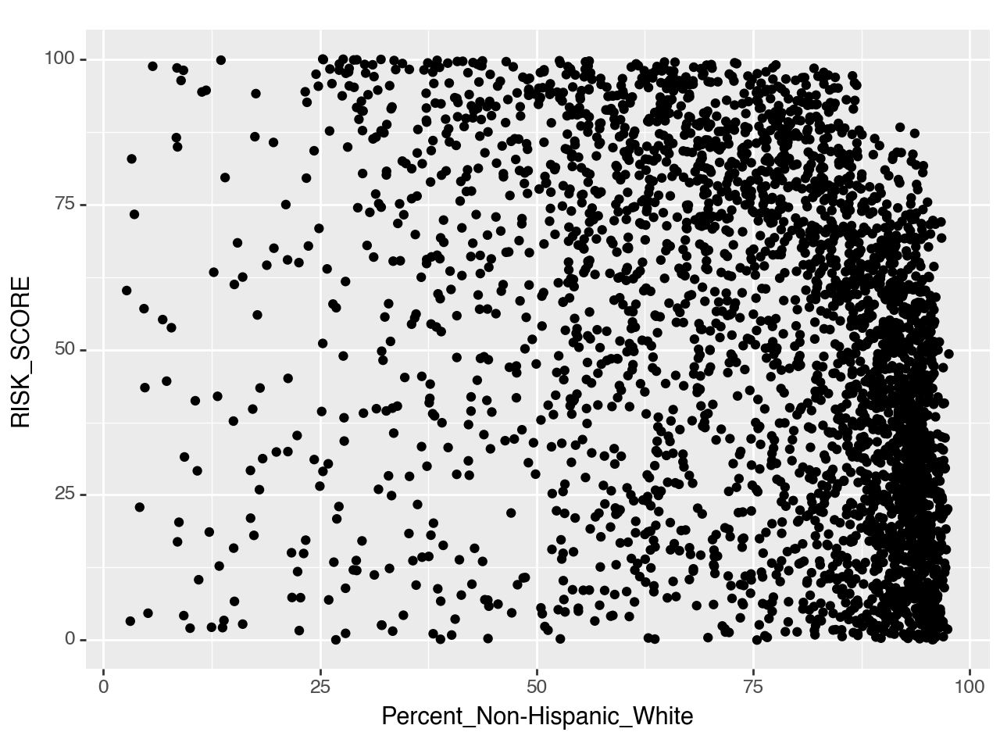

In [64]:
plot1 = (ggplot(Merged_County_Data) 
 + aes(x= "Percent_Non-Hispanic_White", y= "RISK_SCORE") 
 + geom_point())

print(plot1)

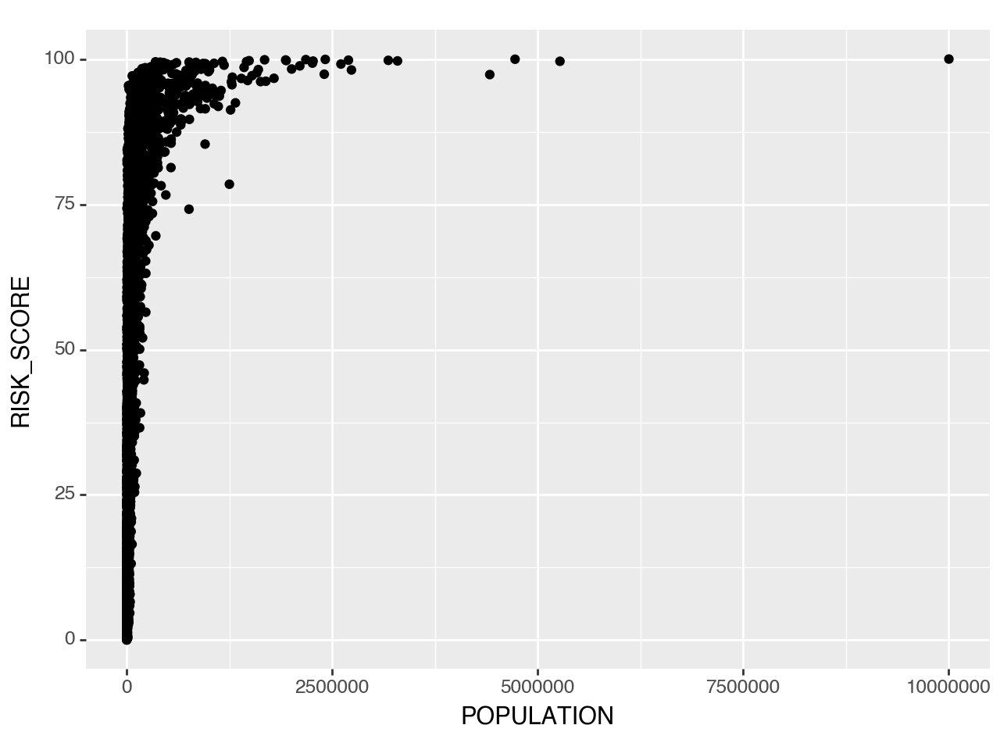

In [65]:
plot2 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "POPULATION", y= "RISK_SCORE") 
 + geom_point())

print(plot2)

In [66]:
#KL - woah these are big counties
Merged_County_Data.sort_values("POPULATION", ascending = False).head(5)

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non-Hispanic_White,Percent_Female,Percent_Rural,Geolocation,County_State,Community_Type
205,CA,6037.0,10005712.0,4797.383550,100.000000,Very High,100.000000,Very High,85.839996,Very High,...,9.9,14.8,21.070906,14.614289,25.311988,50.447325,0.605218,POINT (-118.2618616 34.1963983),"Los Angeles, CA",Urban
611,IL,17031.0,5272775.0,1651.135984,99.618199,Very High,99.597648,Very High,80.040001,Very High,...,8.5,11.9,21.484915,15.603387,41.471225,51.174508,0.045296,POINT (-87.6454546 41.8942937),"Cook, IL",Urban
2624,TX,48201.0,4726200.0,1795.344568,99.968183,Very High,99.969050,Very High,89.529999,Very High,...,11.0,14.5,26.245646,11.360271,27.671969,50.208247,1.213280,POINT (-95.3930371 29.857273),"Harris, TX",Urban
104,AZ,4013.0,4418836.0,9319.141753,97.327394,Relatively High,97.647787,Relatively High,73.970001,Relatively High,...,9.5,14.4,23.047920,15.773671,53.423440,50.295113,2.363800,POINT (-112.4989296 33.3451756),"Maricopa, AZ",Urban
223,CA,6073.0,3295981.0,4571.491190,99.681833,Very High,99.690498,Very High,69.889999,Relatively High,...,9.1,13.8,21.252475,14.884076,43.750512,49.332713,3.297049,POINT (-116.7761174 33.0236041),"San Diego, CA",Urban


/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 161 rows containing missing values.


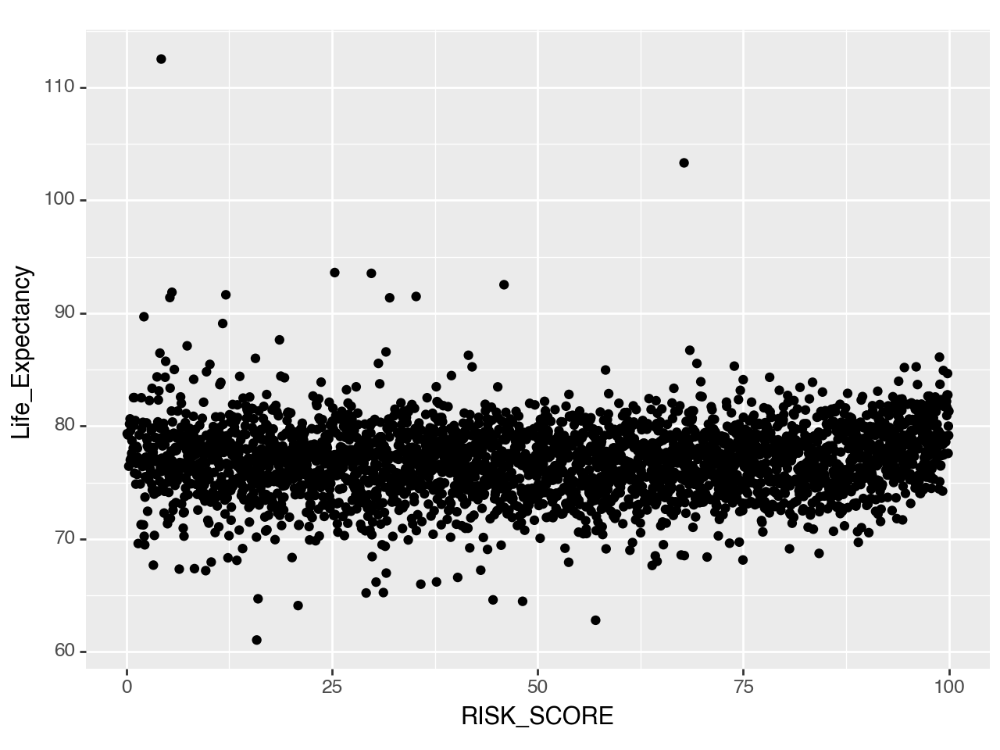

In [67]:
plot3 = (ggplot(Merged_County_Data) 
 + aes(x= "RISK_SCORE", y="Life_Expectancy") 
 + geom_point())

print(plot3)

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 92 rows containing missing values.


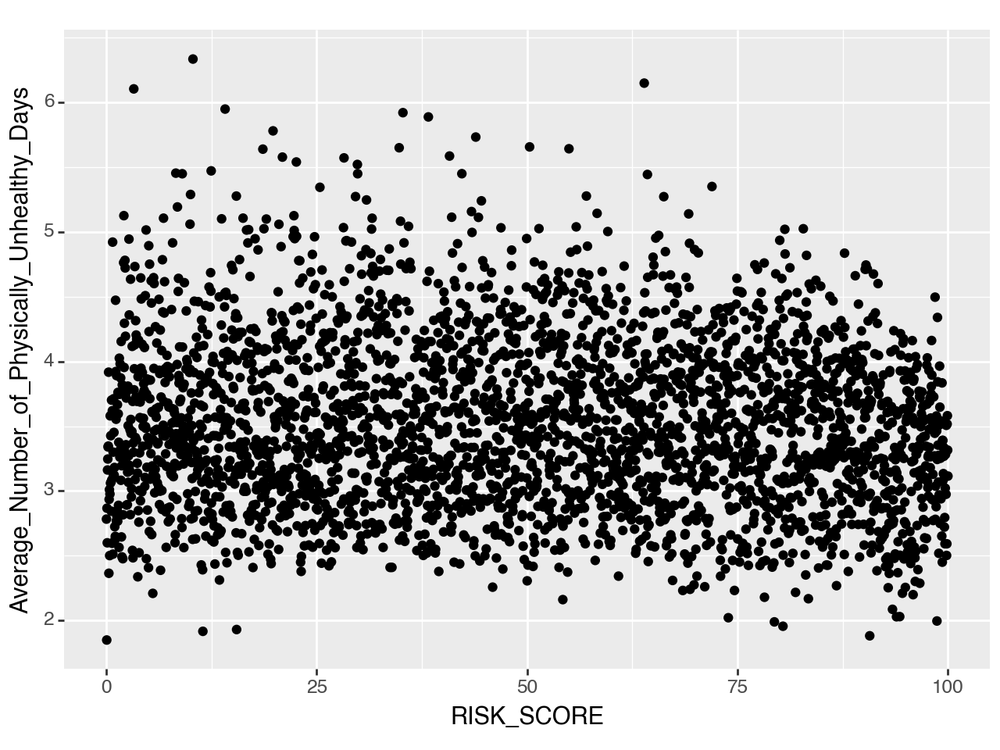

In [68]:
plot4 = (ggplot(Merged_County_Data) 
 + aes(x= "RISK_SCORE", y="Average_Number_of_Physically_Unhealthy_Days") 
 + geom_point())

print(plot4)

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 92 rows containing missing values.


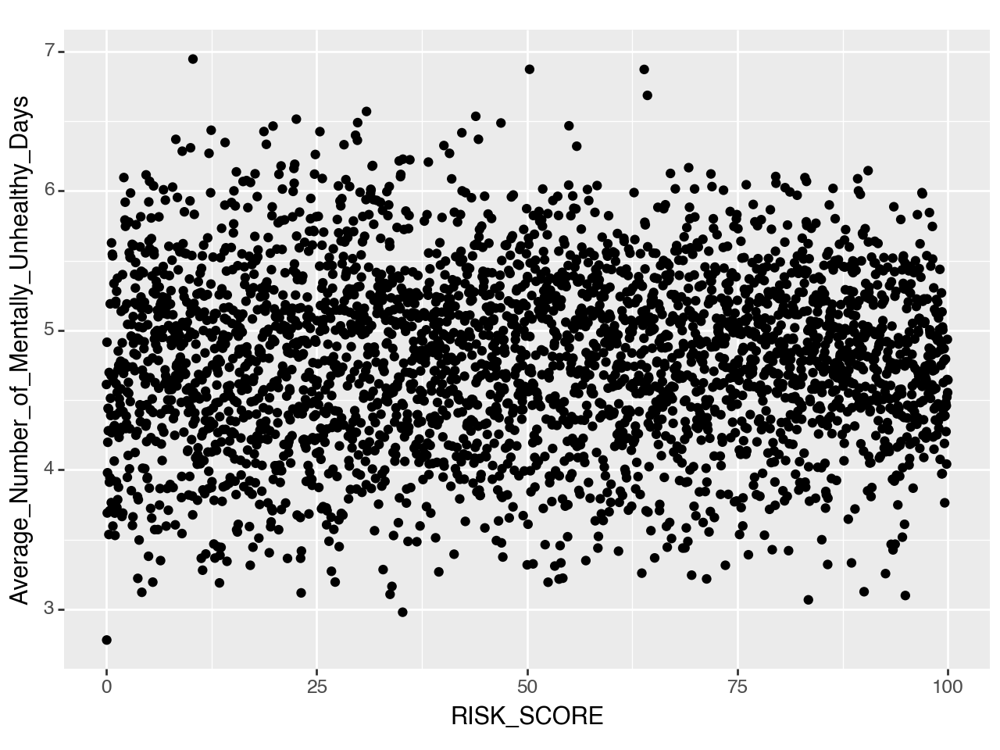

In [69]:
plot5 = (ggplot(Merged_County_Data) 
 + aes(x= "RISK_SCORE", y="Average_Number_of_Mentally_Unhealthy_Days") 
 + geom_point())

print(plot5)

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 151 rows containing missing values.


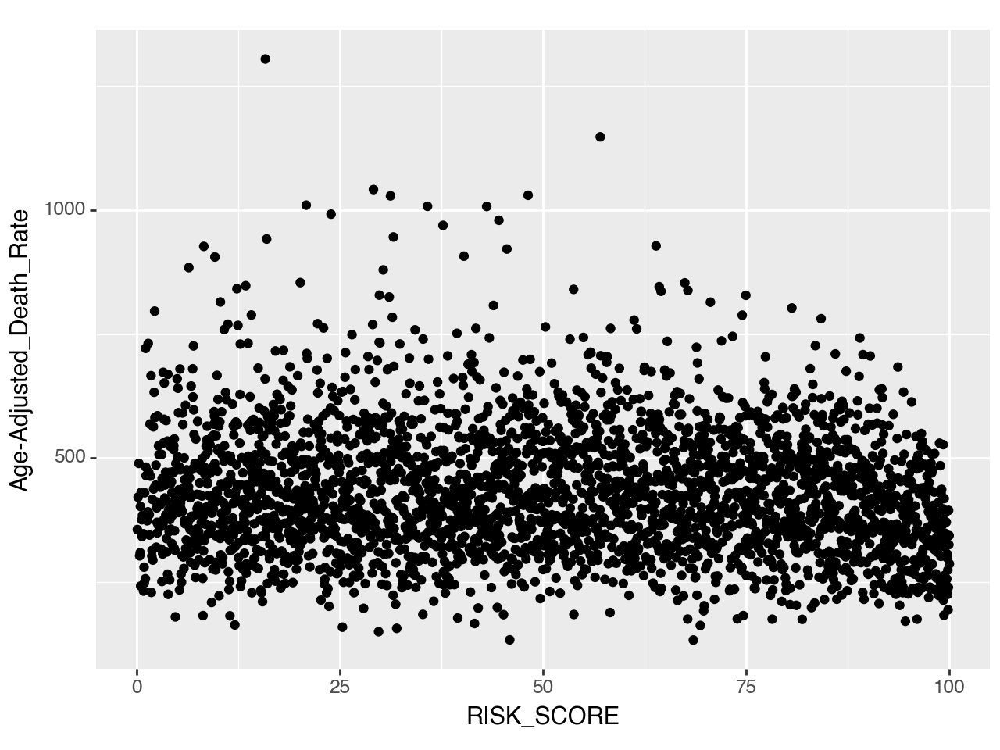

In [70]:
plot6 = (ggplot(Merged_County_Data) 
 + aes(x= "RISK_SCORE", y='Age-Adjusted_Death_Rate') 
 + geom_point())

print(plot6)

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 9 rows containing missing values.


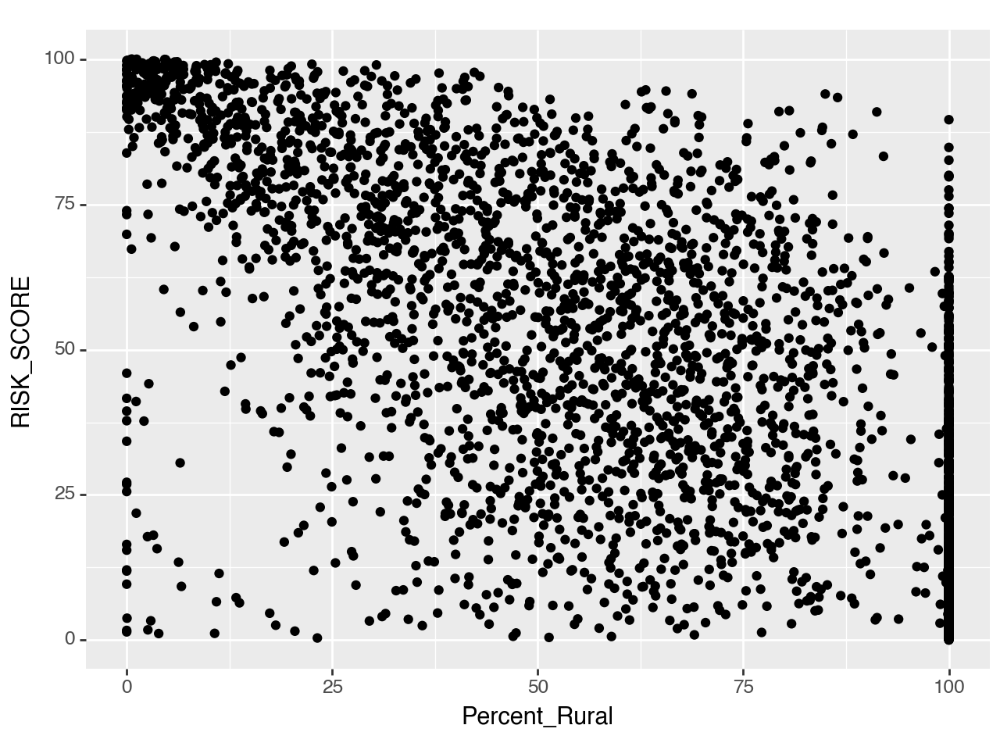

In [71]:
#county risk score versus percent rural

plot11 = (ggplot(Merged_County_Data_clean) 
 + aes(y= "RISK_SCORE", x='Percent_Rural') 
 + geom_point())

print(plot11)

In [72]:
Merged_County_Data_clean.sort_values("Percent_Rural", ascending = False).head(5)

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non-Hispanic_White,Percent_Female,Percent_Rural,Geolocation,County_State,Community_Type,Population_Density
869,IA,19159.0,4653.0,544.305638,20.076360,Very Low,22.717425,Very Low,18.709999,Very Low,...,14.5,22.569519,23.927571,94.524682,49.816771,100.0,POINT (-94.2442514 40.7353342),"Ringgold, IA",Rural,8.548506
2442,TN,47027.0,7571.0,261.962018,10.467706,Very Low,8.016094,Very Low,64.769997,Relatively High,...,19.7,20.079418,25.175381,94.070152,50.430179,100.0,POINT (-85.5457173 36.5457493),"Clay, TN",Rural,28.901136
2297,PA,42105.0,16396.0,1092.382878,4.199809,Very Low,4.363974,Very Low,48.029999,Relatively Moderate,...,17.1,20.314903,25.093794,96.026816,49.775509,100.0,POINT (-77.8944358 41.7485866),"Potter, PA",Rural,15.009389
2786,UT,49017.0,5083.0,5260.781516,19.949093,Very Low,19.158155,Very Low,40.259998,Relatively Moderate,...,15.3,22.538507,23.825307,88.165334,47.338663,100.0,POINT (-111.4509076 37.8316645),"Garfield, UT",Rural,0.966206
1994,ND,38007.0,945.0,1164.757517,3.913458,Very Low,5.416280,Very Low,5.790000,Very Low,...,12.0,20.732984,24.397906,91.204188,46.596859,100.0,POINT (-103.3640163 47.007044),"Billings, ND",Rural,0.811328


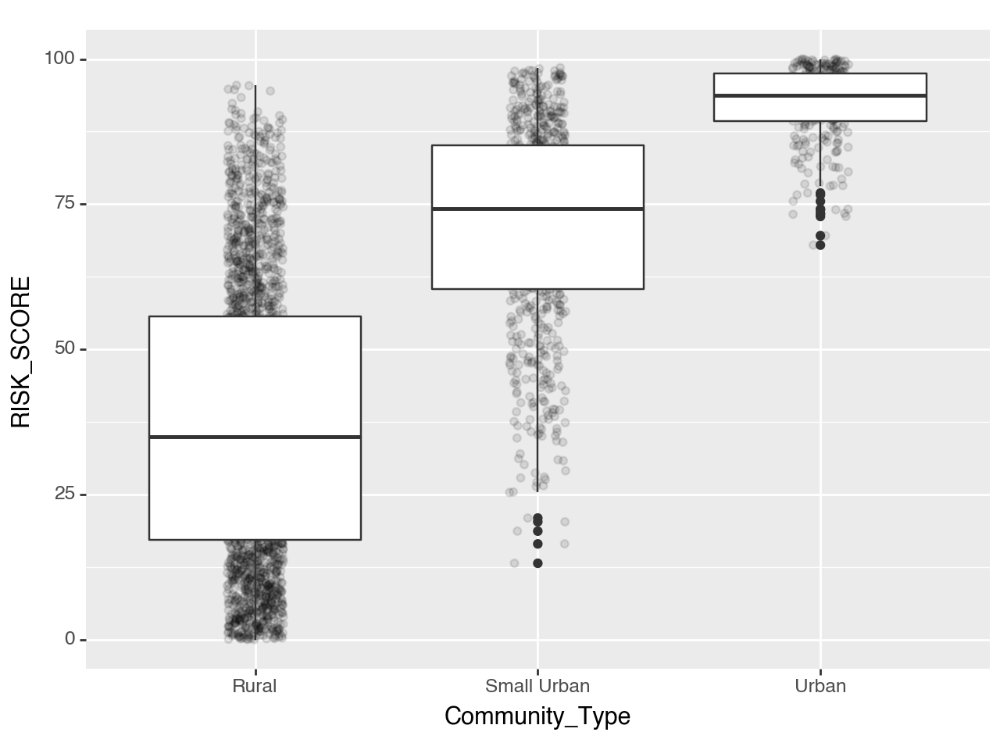

In [73]:
#plot community type and climate risk 
plot12 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "Community_Type", y='RISK_SCORE') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot())

print(plot12)

In [74]:
Merged_County_Data_clean.loc[Merged_County_Data['Community_Type'] == 'Rural'].sort_values("RISK_SCORE", ascending = False).head(10)

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non-Hispanic_White,Percent_Female,Percent_Rural,Geolocation,County_State,Community_Type,Population_Density
1918,NC,37055.0,36860.0,1557.298013,95.482024,Relatively High,95.666976,Relatively High,27.719999,Relatively Low,...,13.6,18.516364,23.367525,86.948131,50.716438,28.959316,POINT (-75.7675364 35.6062688),"Dare, NC",Rural,23.669201
192,CA,6011.0,21811.0,1168.027228,95.418390,Relatively Moderate,93.964717,Relatively Moderate,76.419998,Relatively High,...,15.7,26.659671,15.399005,33.038281,48.952868,31.724170,POINT (-122.2375629 39.1777385),"Colusa, CA",Rural,18.673366
197,CA,6021.0,28889.0,1340.372922,94.813872,Relatively Moderate,94.026617,Relatively Moderate,88.540001,Very High,...,16.4,26.804374,16.684603,49.109530,48.699878,40.871915,POINT (-122.4016998 39.6025462),"Glenn, CA",Rural,21.552957
1164,LA,22101.0,49313.0,1131.027710,94.718422,Relatively Moderate,93.902816,Relatively Moderate,86.379997,Very High,...,18.7,23.890778,18.120750,56.045779,50.449909,13.039341,POINT (-91.4638037 29.6293488),"St. Mary, LA",Rural,43.600170
1897,NC,37013.0,44607.0,972.568215,94.495705,Relatively Moderate,93.469514,Relatively Moderate,84.599998,Very High,...,15.4,19.575875,25.044976,65.793380,52.026176,65.600201,POINT (-76.8420144 35.4823128),"Beaufort, NC",Rural,45.865163
1921,NC,37061.0,48624.0,828.497933,93.382119,Relatively Moderate,91.612504,Relatively Moderate,90.129997,Very High,...,15.8,24.140987,19.699062,50.446254,50.741008,86.464405,POINT (-77.9335434 34.9344033),"Duplin, NC",Rural,58.689344
2212,OR,41007.0,41036.0,1094.535576,92.363983,Relatively Moderate,91.736305,Relatively Moderate,56.080002,Relatively Moderate,...,16.1,18.258790,24.161684,84.448696,50.246353,38.972434,POINT (-123.7050366 46.0245094),"Clatsop, OR",Rural,37.491700
26,AL,1053.0,36706.0,962.761819,91.377665,Relatively Moderate,89.755494,Relatively Moderate,87.080002,Very High,...,18.5,22.613695,18.401046,60.077931,49.480912,63.511574,POINT (-87.1684097 31.1222867),"Escambia, AL",Rural,38.125733
345,FL,12051.0,39371.0,1201.385234,91.154948,Relatively Moderate,86.010523,Relatively Moderate,99.589996,Very High,...,17.3,26.730831,13.717659,29.796840,47.101431,37.892182,POINT (-81.1521142 26.539967),"Hendry, FL",Rural,32.771337
1899,NC,37017.0,29597.0,896.744081,90.900414,Relatively Moderate,88.579387,Relatively Moderate,87.650002,Very High,...,16.3,20.382727,23.495343,54.574090,52.535140,91.233305,POINT (-78.5394885 34.5919375),"Bladen, NC",Rural,33.004957


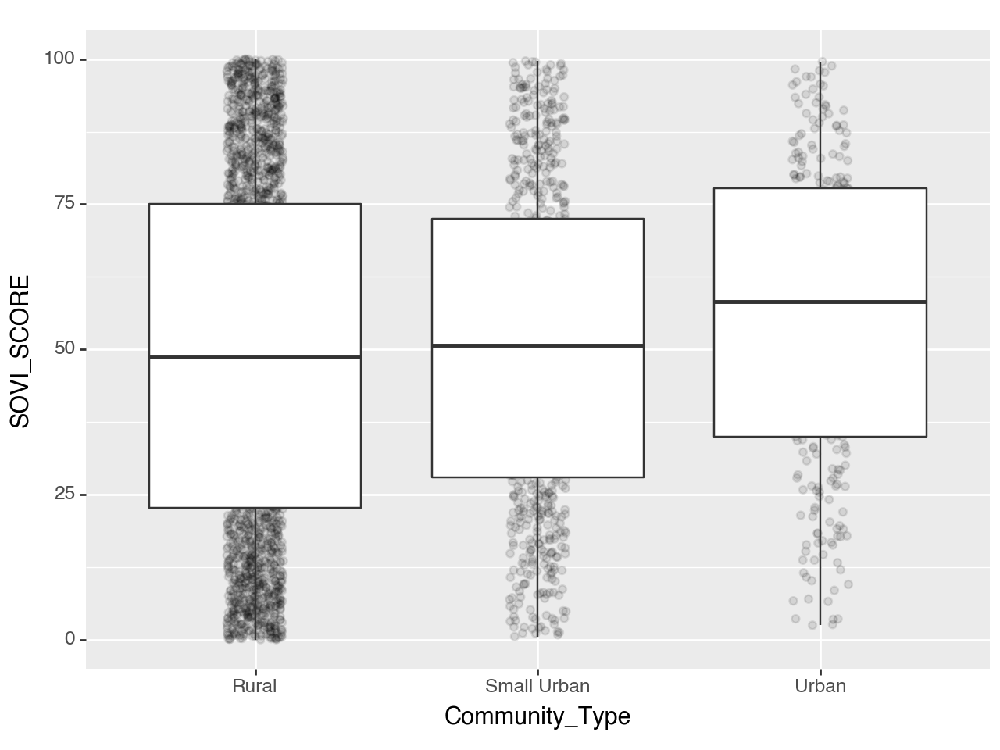

In [75]:
#social vulnerability score and community type
plot13 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "Community_Type", y='SOVI_SCORE') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot())

print(plot13)

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 9 rows containing missing values.


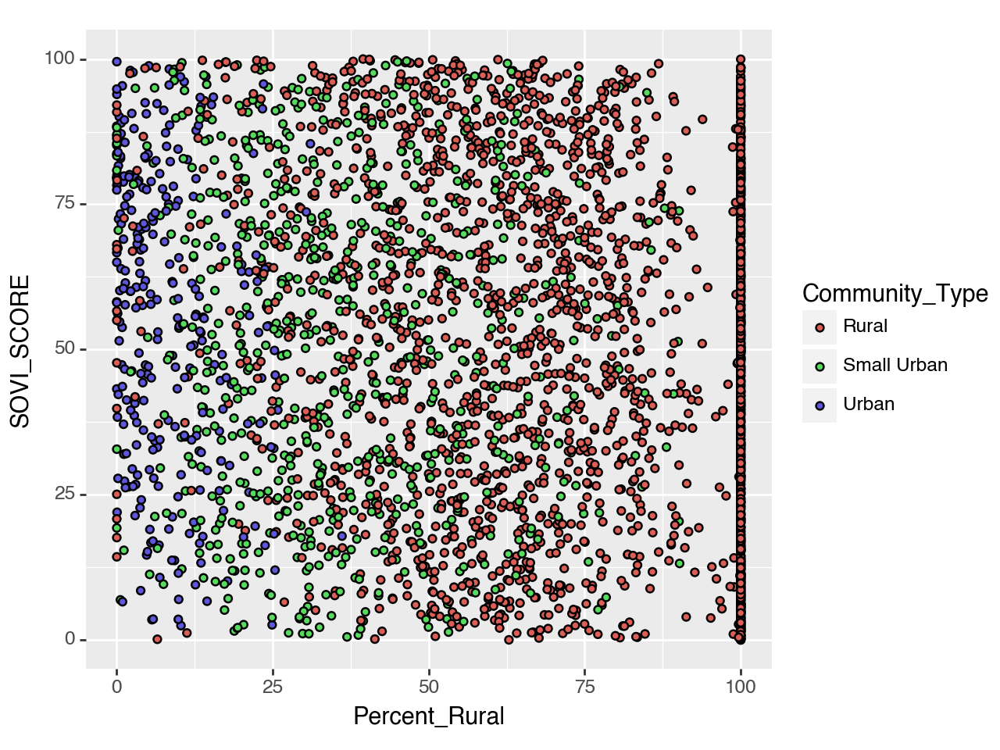

In [76]:
plot14 = (ggplot(Merged_County_Data_clean) 
 + aes(y= "SOVI_SCORE", x='Percent_Rural', fill = "Community_Type") 
 + geom_point())

print(plot14)

#KL - what are the small/medium metro areas that are more than 75% rural??

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 62 rows containing missing values.


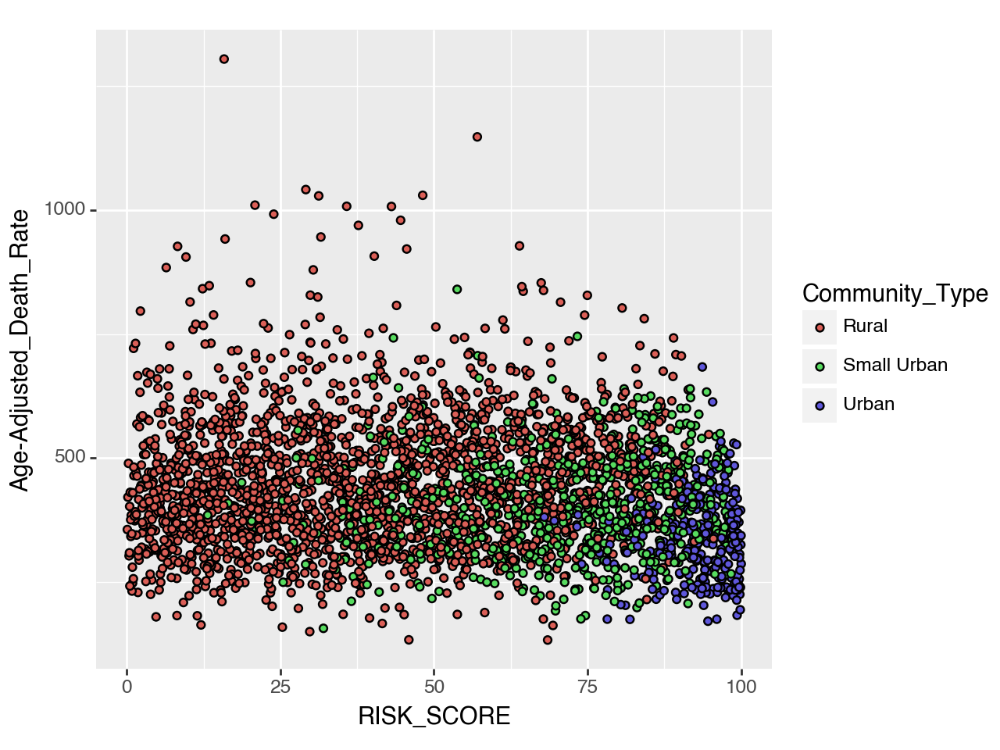

In [80]:
Merged_County_Data_clean.loc[Merged_County_Data['Community_Type'] == 'Small/Medium Urban'].sort_values("Percent_Rural", ascending = False).head(5)

plot15 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_SCORE", y='Age-Adjusted_Death_Rate', fill = "Community_Type") 
 + geom_point())

print(plot15)

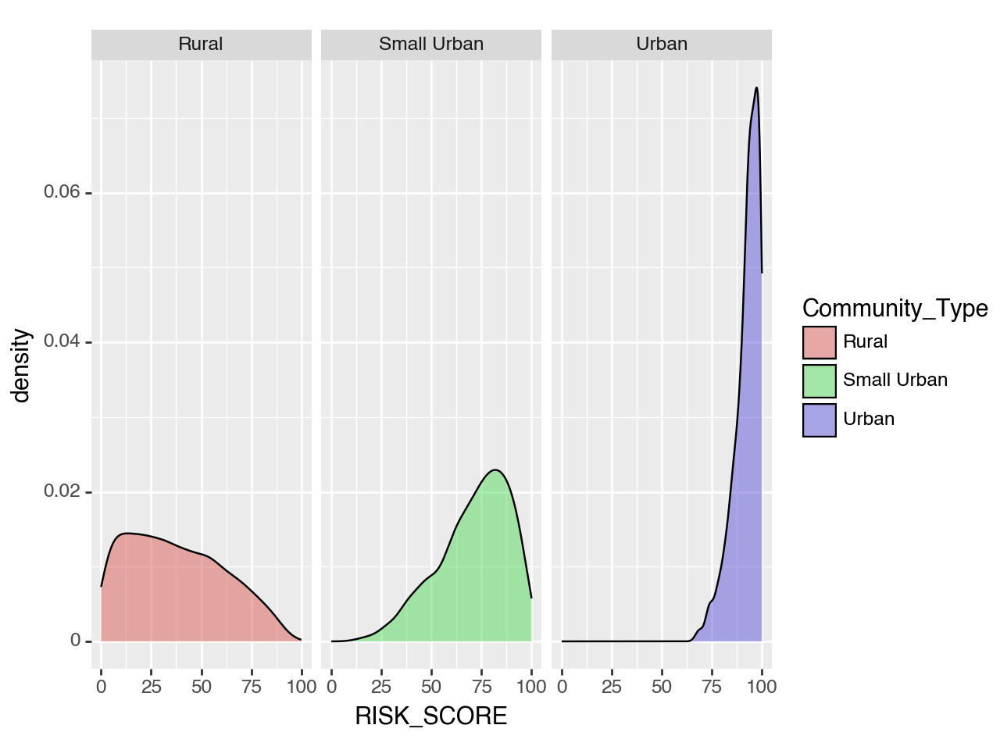

<Figure Size: (640 x 480)>

In [81]:
(ggplot(Merged_County_Data_clean, aes(x = 'RISK_SCORE', fill="Community_Type")) +
  geom_density(color="black",alpha=.5)+
  xlim(0,100) +
  facet_grid(" ~ Community_Type"))

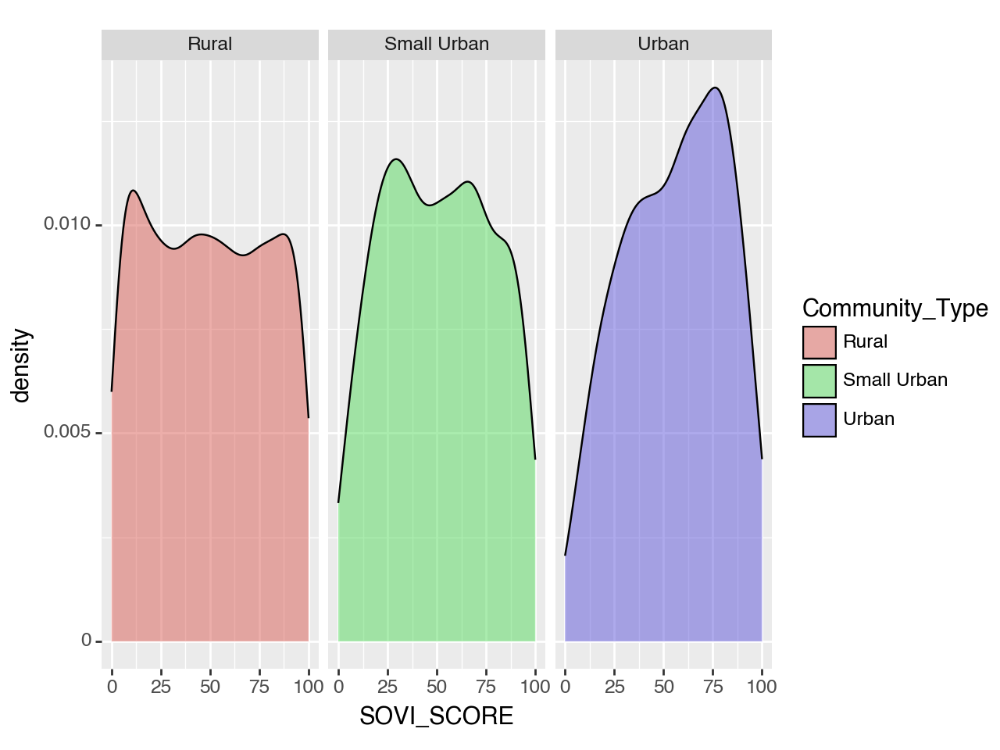

<Figure Size: (640 x 480)>

In [82]:
(ggplot(Merged_County_Data_clean, aes(x = 'SOVI_SCORE', fill="Community_Type")) +
  geom_density(color="black",alpha=.5)+
  xlim(0,100) +
  facet_grid(" ~ Community_Type"))

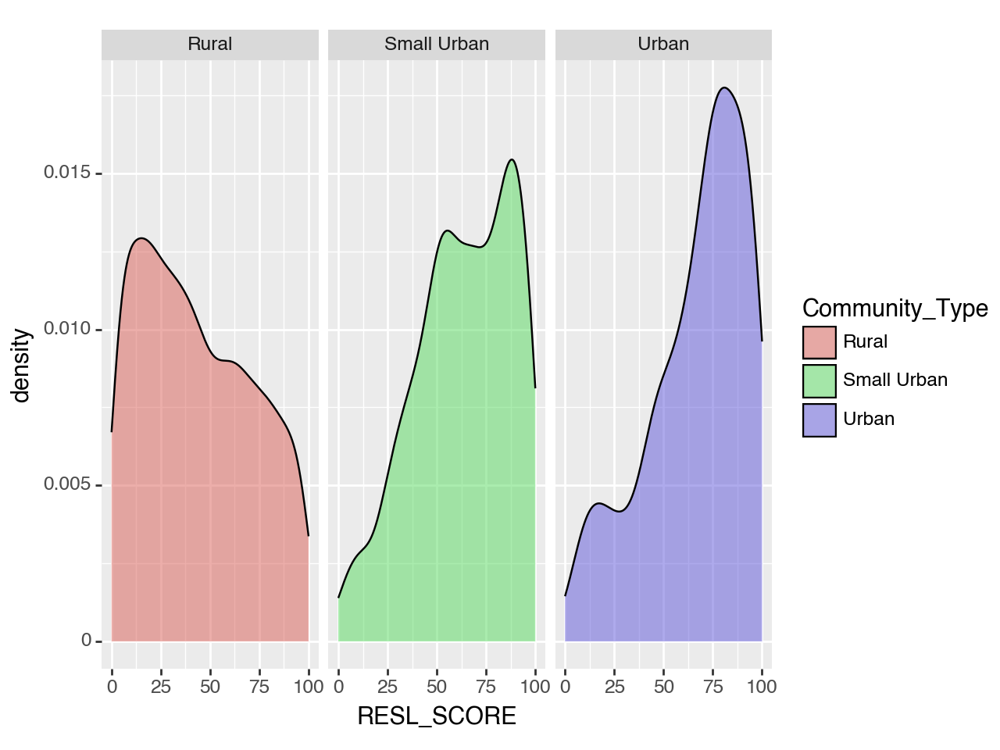

<Figure Size: (640 x 480)>

In [83]:
(ggplot(Merged_County_Data_clean, aes(x = 'RESL_SCORE', fill="Community_Type")) +
  geom_density(color="black",alpha=.5)+
  xlim(0,100) +
  facet_grid(" ~ Community_Type"))

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


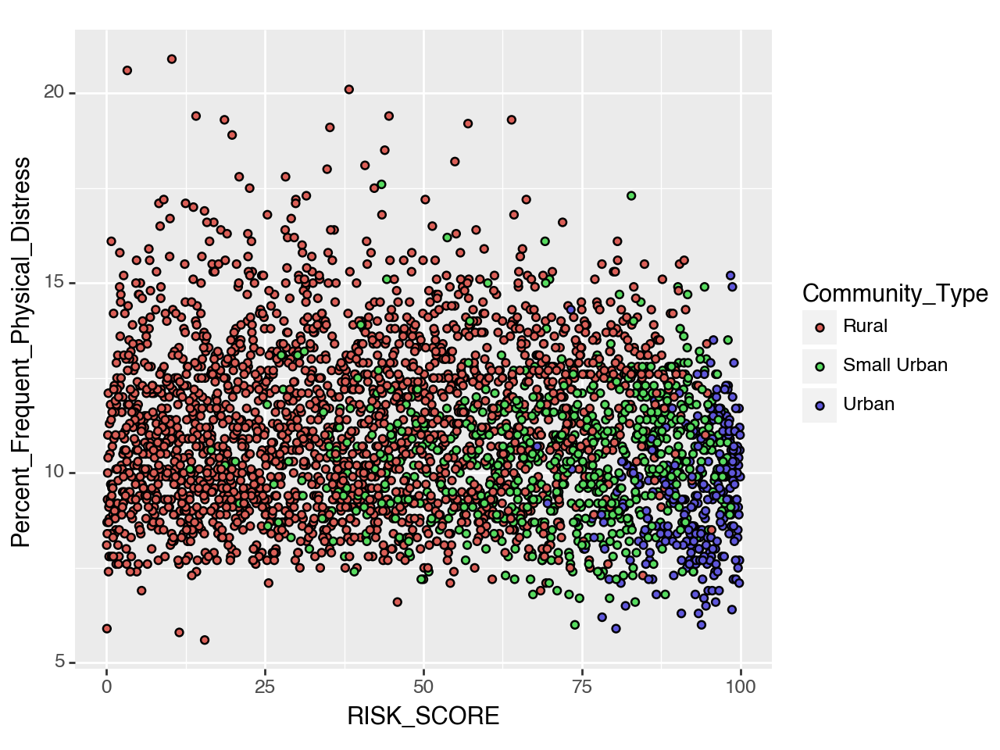

In [84]:
plot17 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_SCORE", y='Percent_Frequent_Physical_Distress', fill = "Community_Type") 
 + geom_point())

print(plot17)

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


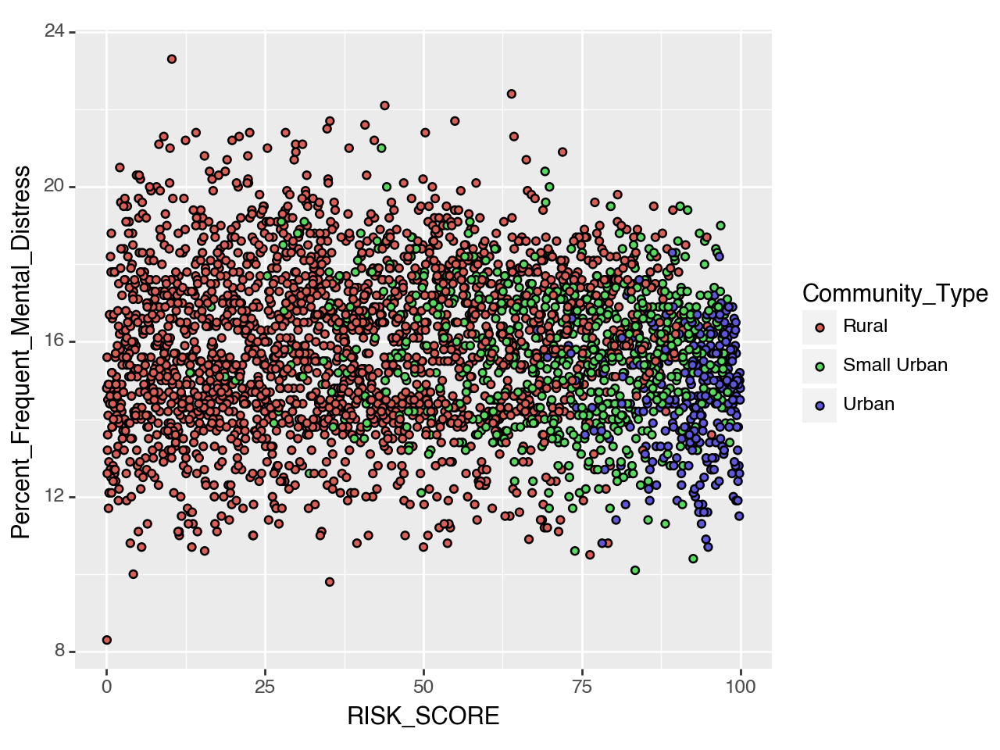

In [85]:
plot18 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_SCORE", y='Percent_Frequent_Mental_Distress', fill = "Community_Type") 
 + geom_point())

print(plot18)

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 3 rows containing non-finite values.
/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_jitter : Removed 3 rows containing missing values.


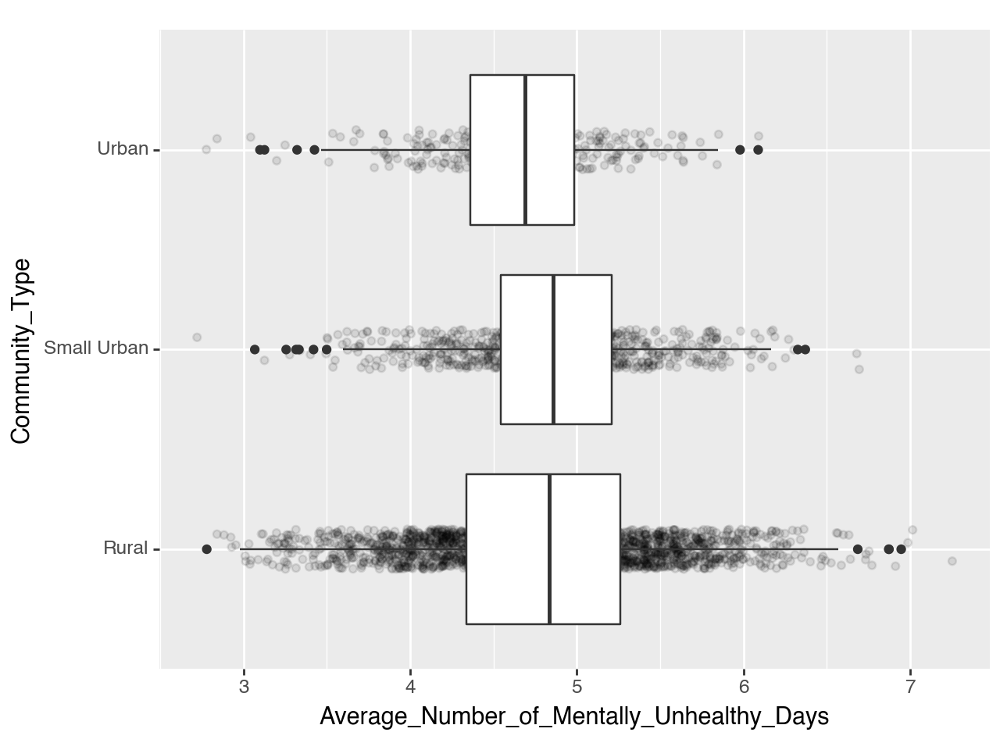

In [86]:
plot19 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "Community_Type", y='Average_Number_of_Mentally_Unhealthy_Days') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot()
 + coord_flip())

print(plot19)

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 3 rows containing non-finite values.
/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_jitter : Removed 3 rows containing missing values.


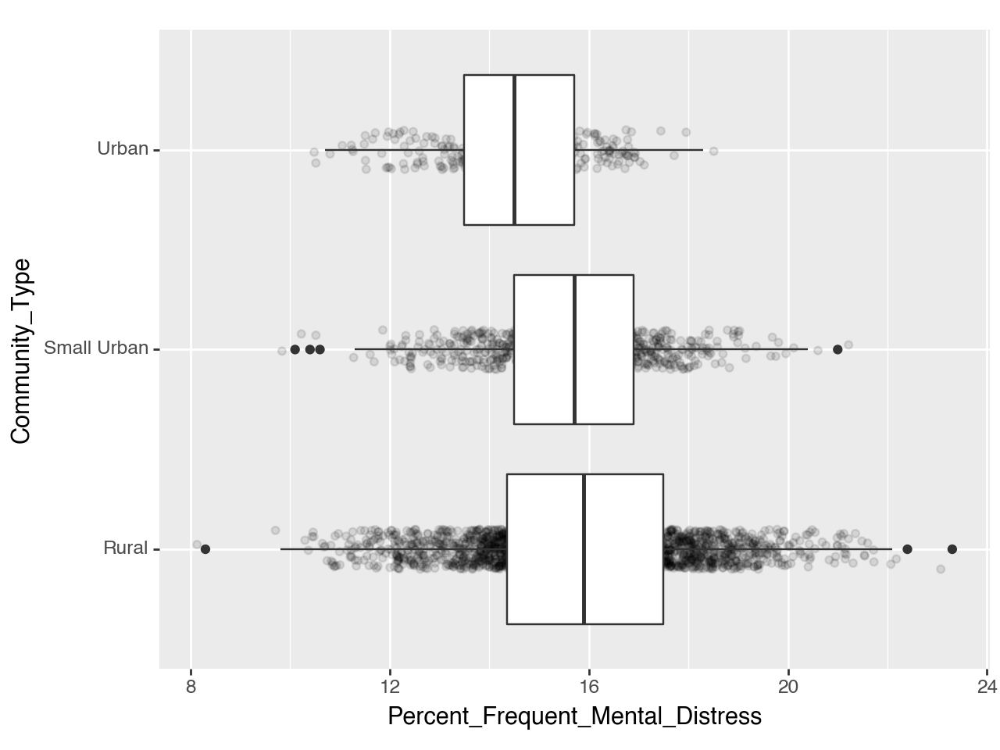

<Figure Size: (640 x 480)>

In [87]:
(ggplot(Merged_County_Data_clean) 
 + aes(x= "Community_Type", y='Percent_Frequent_Mental_Distress') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot()
 + coord_flip())

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 28 rows containing missing values.


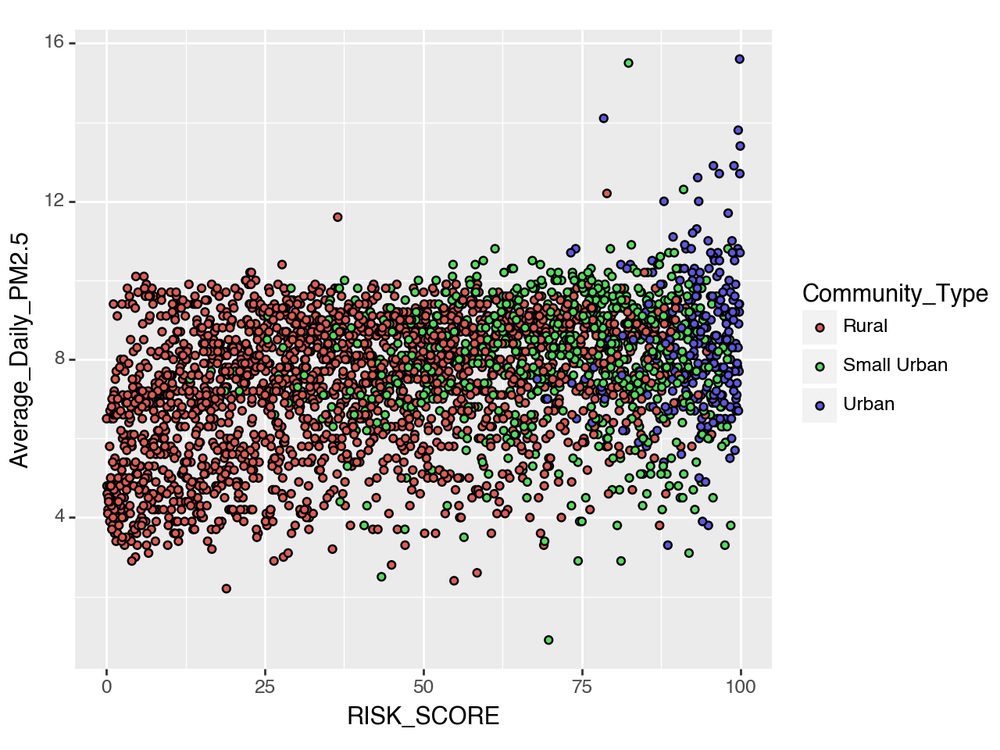

<Figure Size: (640 x 480)>

In [88]:
#air pollution particulate matter
(ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_SCORE", y='Average_Daily_PM2.5', fill = "Community_Type") 
 + geom_point())

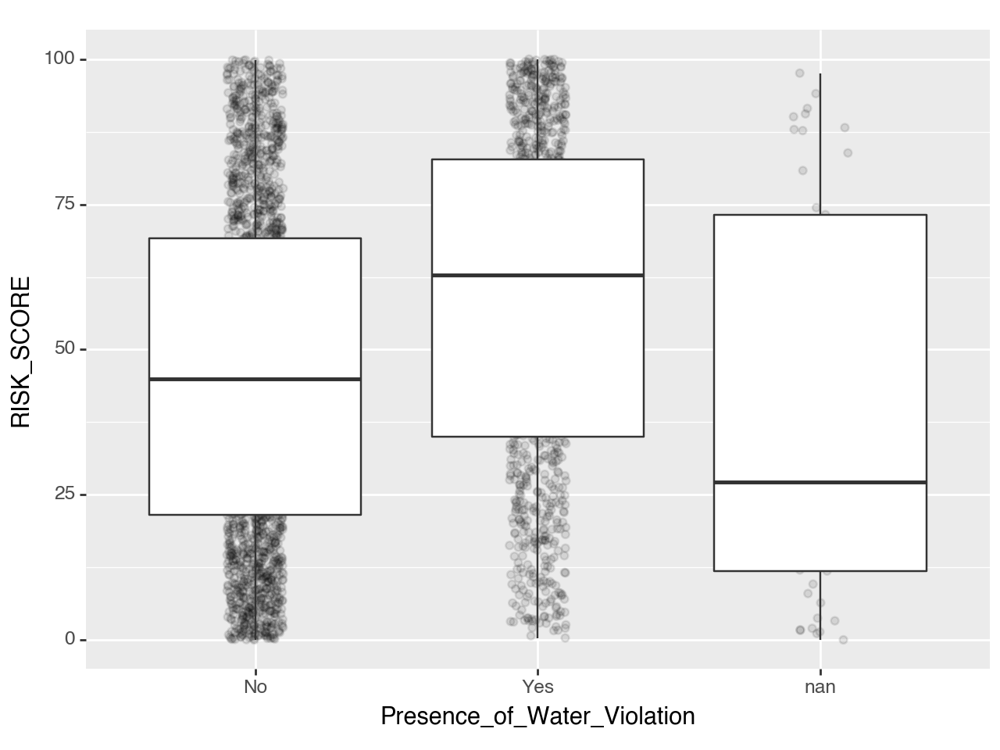

<Figure Size: (640 x 480)>

In [89]:
(ggplot(Merged_County_Data_clean) 
 + aes(y= "RISK_SCORE", x='Presence_of_Water_Violation') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot())

### Further Cleaning and Plotting

In [91]:
print(Merged_County_Data_clean.columns)

Index(['STATEABBRV', 'FIPS', 'POPULATION', 'AREA', 'RISK_SCORE', 'RISK_RATNG',
       'EAL_SCORE', 'EAL_RATNG', 'SOVI_SCORE', 'SOVI_RATNG', 'RESL_SCORE',
       'RESL_RATNG', 'Percent_Fair_or_Poor_Health',
       'Average_Number_of_Physically_Unhealthy_Days',
       'Average_Number_of_Mentally_Unhealthy_Days',
       'Number_Primary_Care_Physicians', 'Primary_Care_Physicians_Rate',
       'Primary_Care_Physicians_Ratio', 'Number_Dentists', 'Dentist_Rate',
       'Dentist_Ratio', 'Number_Mental_Health_Providers',
       'Mental_Health_Provider_Rate', 'Mental_Health_Provider_Ratio',
       'Average_Daily_PM2.5', 'Presence_of_Water_Violation', 'State', 'County',
       'Life_Expectancy', 'Age-Adjusted_Death_Rate',
       'Percent_Frequent_Physical_Distress',
       'Percent_Frequent_Mental_Distress', 'Percent_Less_than_18_Years_of_Age',
       'Percent_65_and_Over', 'Percent_Non-Hispanic_White', 'Percent_Female',
       'Percent_Rural', 'Geolocation', 'County_State', 'Community_Type',
   

### Plotting Exploration with Density and Rural

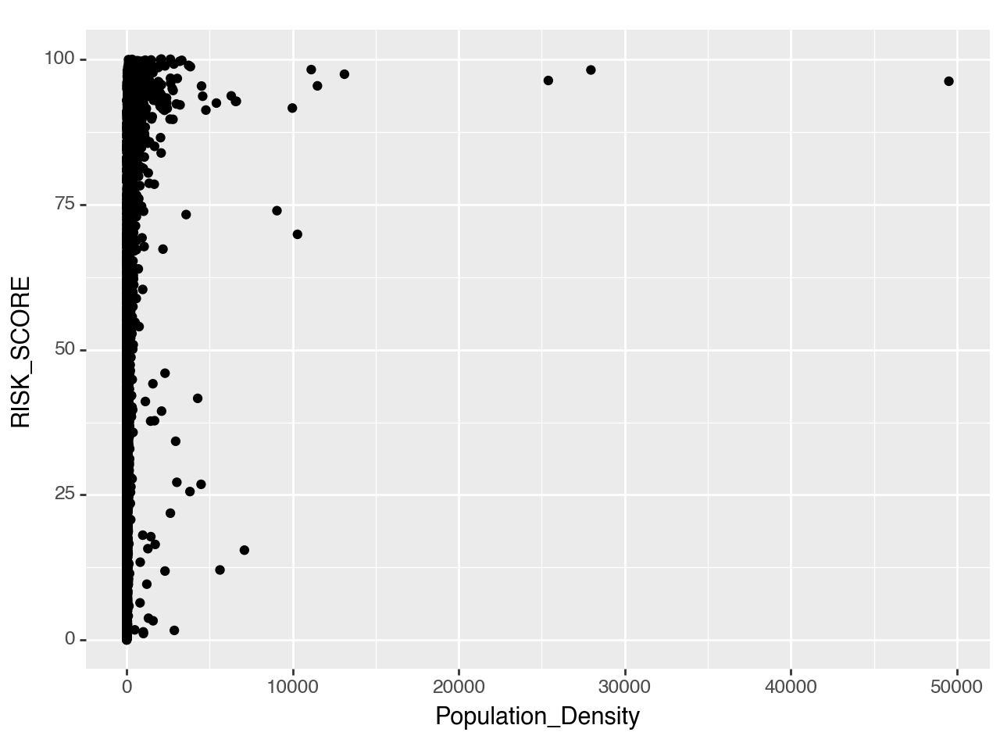

In [93]:
plot20 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "Population_Density", y= "RISK_SCORE") 
 + geom_point())

print(plot20)

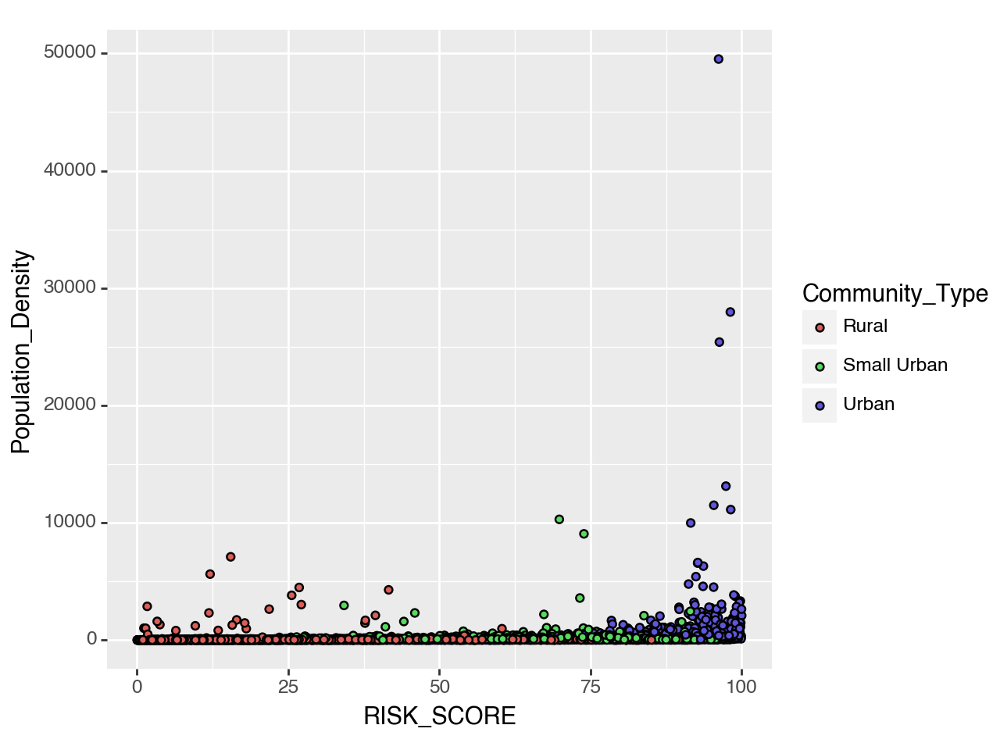

In [95]:
plot21 = (ggplot(Merged_County_Data_clean) 
 + aes(y= "Population_Density", x='RISK_SCORE', fill = "Community_Type") 
 + geom_point())

print(plot21)

In [96]:
# maybe we can filter some urban density outliers?

# just to see
no_density_outliers = Merged_County_Data_clean[Merged_County_Data_clean['Population_Density'] < 20000]

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


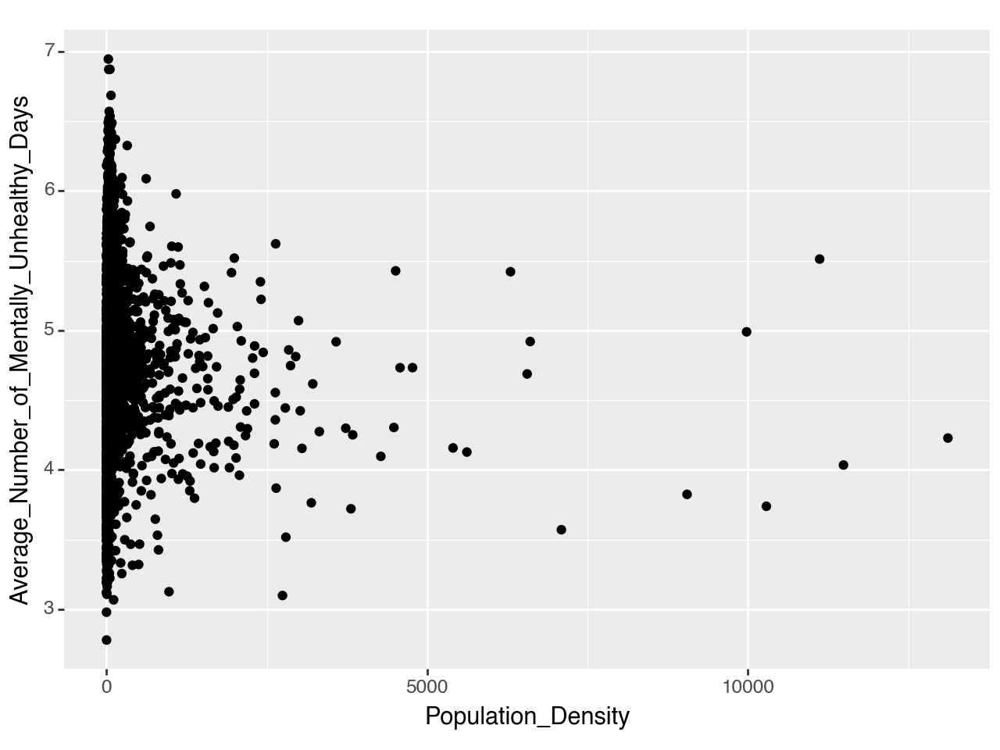

In [97]:
plot22 = (ggplot(no_density_outliers) 
 + aes(x= "Population_Density", y="Average_Number_of_Mentally_Unhealthy_Days") 
 + geom_point())

print(plot22)

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 62 rows containing missing values.


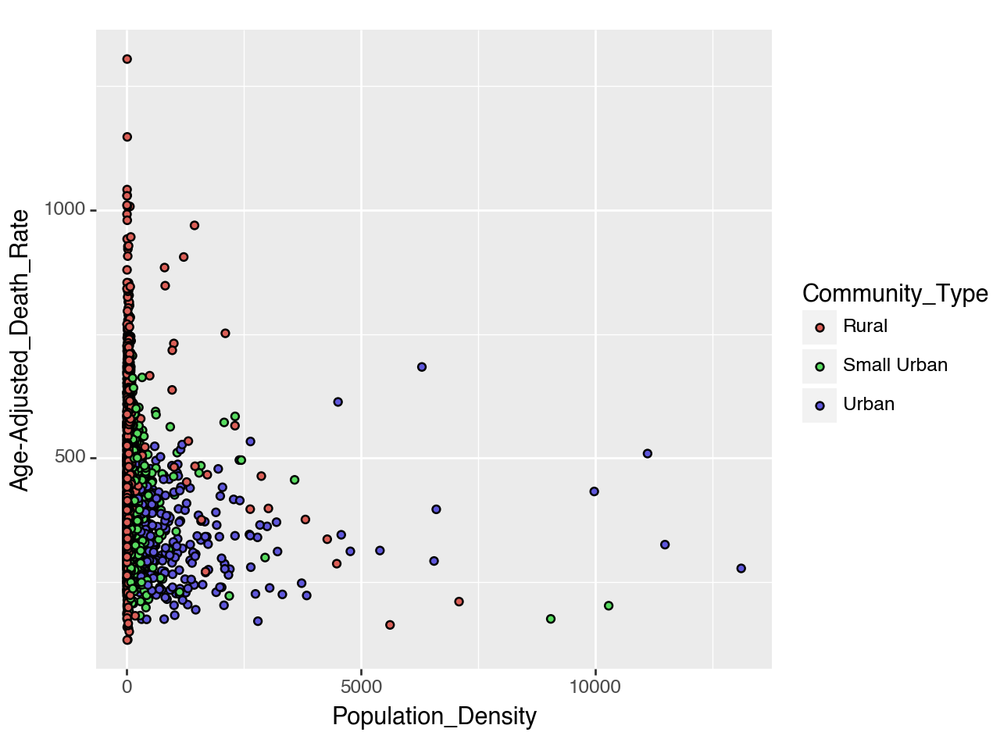

In [98]:
# without outliers

plot23 = (ggplot(no_density_outliers) 
 + aes(x= "Population_Density", y='Age-Adjusted_Death_Rate', fill = "Community_Type") 
 + geom_point())

print(plot23)

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 62 rows containing missing values.


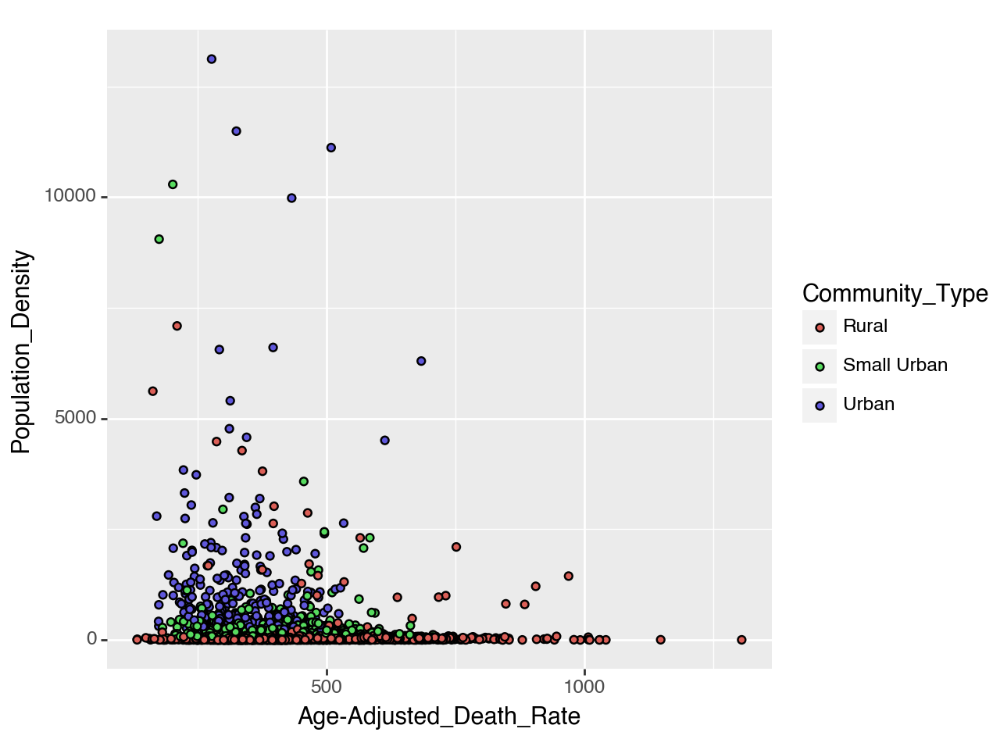

<Figure Size: (640 x 480)>

In [99]:
(ggplot(no_density_outliers) 
 + aes(y= "Population_Density", x='Age-Adjusted_Death_Rate', fill = "Community_Type") 
 + geom_point())

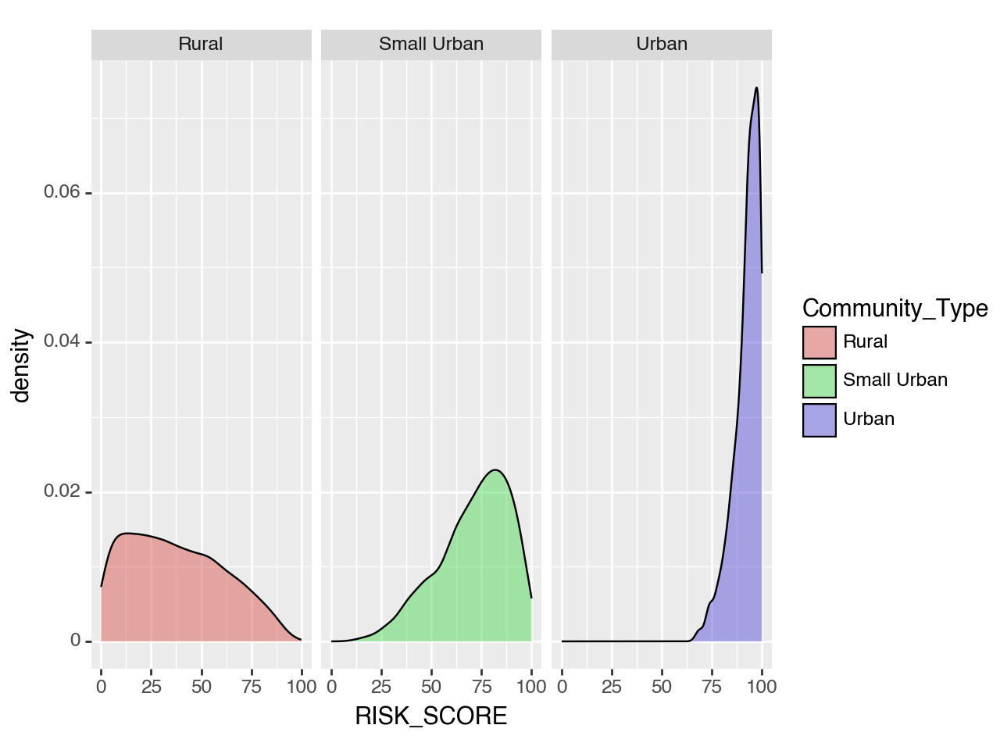

<Figure Size: (640 x 480)>

In [100]:
(ggplot(Merged_County_Data_clean, aes(x = 'RISK_SCORE', fill="Community_Type")) +
  geom_density(color="black",alpha=.5)+
  xlim(0,100) +
  facet_grid(" ~ Community_Type"))

In [101]:
# Reordering Columns and Saving Dataset to Repository

# Reorder columns

# Specify the desired column order
column_order = ['FIPS', 'STATEABBRV', 'State', 'County', 'County_State', 'Community_Type', 'POPULATION', 
                'AREA',
                'Population_Density','Percent_Rural', 'RISK_SCORE', 'RISK_RATNG',
       'EAL_SCORE', 'EAL_RATNG', 'SOVI_SCORE', 'SOVI_RATNG', 'RESL_SCORE',
       'RESL_RATNG', 'Percent_Fair_or_Poor_Health',
       'Average_Number_of_Physically_Unhealthy_Days',
       'Average_Number_of_Mentally_Unhealthy_Days',
       'Number_Primary_Care_Physicians', 'Primary_Care_Physicians_Rate',
       'Primary_Care_Physicians_Ratio', 'Number_Dentists', 'Dentist_Rate',
       'Dentist_Ratio', 'Number_Mental_Health_Providers',
       'Mental_Health_Provider_Rate', 'Mental_Health_Provider_Ratio',
       'Average_Daily_PM2.5', 'Presence_of_Water_Violation', 
       'Life_Expectancy', 'Age-Adjusted_Death_Rate',
       'Percent_Frequent_Physical_Distress',
       'Percent_Frequent_Mental_Distress',
       'Percent_Less_than_18_Years_of_Age', 'Percent_65_and_Over',
       'Percent_Non-Hispanic_White', 'Percent_Female',
       'Geolocation']

# Reorder the columns in the original DataFrame
Merged_County_Data_clean = Merged_County_Data_clean[column_order]

# reordered dataframe
Merged_County_Data_clean.head()

,FIPS,STATEABBRV,State,County,County_State,Community_Type,POPULATION,AREA,Population_Density,Percent_Rural,...,Presence_of_Water_Violation,Life_Expectancy,Age-Adjusted_Death_Rate,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non-Hispanic_White,Percent_Female,Geolocation
0,1001.0,AL,Alabama,Autauga,"Autauga, AL",Small Urban,58764.0,610.470508,96.260178,42.002162,...,No,76.585650,427.073326,10.7,16.2,23.406380,16.048735,72.454522,51.378289,POINT (-86.6464395 32.5322367)
1,1003.0,AL,Alabama,Baldwin,"Baldwin, AL",Small Urban,231365.0,2047.738775,112.985603,42.279099,...,Yes,77.724729,381.702031,9.9,16.1,21.218250,21.469824,83.148763,51.347715,POINT (-87.7460666 30.6592183)
2,1005.0,AL,Alabama,Barbour,"Barbour, AL",Rural,25160.0,913.646511,27.538003,67.789635,...,Yes,72.867210,589.566095,14.9,18.0,20.549591,19.976767,45.305240,46.703253,POINT (-85.4051035 31.8702531)
3,1007.0,AL,Alabama,Bibb,"Bibb, AL",Rural,22239.0,632.486798,35.161208,68.352607,...,No,73.609363,567.508146,12.7,17.4,20.118343,16.737109,73.564088,46.015927,POINT (-87.1271475 33.0158929)
4,1009.0,AL,Alabama,Blount,"Blount, AL",Small Urban,58992.0,657.196555,89.763100,89.951502,...,No,74.171463,532.836482,11.9,17.4,23.053471,18.725970,86.329839,50.192239,POINT (-86.56644 33.9773575)


In [104]:
#saving dataset
#saving dataframe as a csv file
Merged_County_Data_clean.to_csv("/Users/holtcochran/PPOL5203_FinalProject/Datasets/Clean_Data/NRI_county_health_data.csv", sep=',', index=False, encoding='utf-8')

# Southeast Data Subset

Code to subset Southeast region

In [107]:
NRI_county_health_data = pd.read_csv("NRI_county_health_data.csv")
NRI_county_health_data.head()

,FIPS,STATEABBRV,State,County,County_State,Community_Type,POPULATION,AREA,Population_Density,Percent_Rural,...,Presence_of_Water_Violation,Life_Expectancy,Age-Adjusted_Death_Rate,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non-Hispanic_White,Percent_Female,Geolocation
0,1001.0,AL,Alabama,Autauga,"Autauga, AL",Small Urban,58764.0,610.470508,96.260178,42.002162,...,No,76.585650,427.073326,10.7,16.2,23.406380,16.048735,72.454522,51.378289,POINT (-86.6464395 32.5322367)
1,1003.0,AL,Alabama,Baldwin,"Baldwin, AL",Small Urban,231365.0,2047.738775,112.985603,42.279099,...,Yes,77.724729,381.702031,9.9,16.1,21.218250,21.469824,83.148763,51.347715,POINT (-87.7460666 30.6592183)
2,1005.0,AL,Alabama,Barbour,"Barbour, AL",Rural,25160.0,913.646511,27.538003,67.789635,...,Yes,72.867210,589.566095,14.9,18.0,20.549591,19.976767,45.305240,46.703253,POINT (-85.4051035 31.8702531)
3,1007.0,AL,Alabama,Bibb,"Bibb, AL",Rural,22239.0,632.486798,35.161208,68.352607,...,No,73.609363,567.508146,12.7,17.4,20.118343,16.737109,73.564088,46.015927,POINT (-87.1271475 33.0158929)
4,1009.0,AL,Alabama,Blount,"Blount, AL",Small Urban,58992.0,657.196555,89.763100,89.951502,...,No,74.171463,532.836482,11.9,17.4,23.053471,18.725970,86.329839,50.192239,POINT (-86.56644 33.9773575)


In [110]:
# remove and replace hyphen in "age adjusted death rate" variable
NRI_county_health_data = NRI_county_health_data.rename(columns={'Age-Adjusted_Death_Rate':'Age_Adjusted_Death_Rate'})

# remove and replace hypthen in "percent non hispanic white" variable
NRI_county_health_data = NRI_county_health_data.rename(columns={'Percent_Non-Hispanic_White':'Percent_Non_Hispanic_White'})

print(NRI_county_health_data.columns)

Index(['FIPS', 'STATEABBRV', 'State', 'County', 'County_State',
       'Community_Type', 'POPULATION', 'AREA', 'Population_Density',
       'Percent_Rural', 'RISK_SCORE', 'RISK_RATNG', 'EAL_SCORE', 'EAL_RATNG',
       'SOVI_SCORE', 'SOVI_RATNG', 'RESL_SCORE', 'RESL_RATNG',
       'Percent_Fair_or_Poor_Health',
       'Average_Number_of_Physically_Unhealthy_Days',
       'Average_Number_of_Mentally_Unhealthy_Days',
       'Number_Primary_Care_Physicians', 'Primary_Care_Physicians_Rate',
       'Primary_Care_Physicians_Ratio', 'Number_Dentists', 'Dentist_Rate',
       'Dentist_Ratio', 'Number_Mental_Health_Providers',
       'Mental_Health_Provider_Rate', 'Mental_Health_Provider_Ratio',
       'Average_Daily_PM2.5', 'Presence_of_Water_Violation', 'Life_Expectancy',
       'Age_Adjusted_Death_Rate', 'Percent_Frequent_Physical_Distress',
       'Percent_Frequent_Mental_Distress', 'Percent_Less_than_18_Years_of_Age',
       'Percent_65_and_Over', 'Percent_Non_Hispanic_White', 'Percent_Femal

In [116]:
# define southeast states
southeast_states = ["FL", "GA", "TN", "NC", "SC", "AL", "MS", "KY", "WV", "VA"]

# filter dataframe to only include southeast states
NRI_county_health_data_southeast = NRI_county_health_data[NRI_county_health_data['STATEABBRV'].isin(southeast_states)]
NRI_county_health_data_southeast


,FIPS,STATEABBRV,State,County,County_State,Community_Type,POPULATION,AREA,Population_Density,Percent_Rural,...,Presence_of_Water_Violation,Life_Expectancy,Age_Adjusted_Death_Rate,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non_Hispanic_White,Percent_Female,Geolocation
0,1001.0,AL,Alabama,Autauga,"Autauga, AL",Small Urban,58764.0,610.470508,96.260178,42.002162,...,No,76.585650,427.073326,10.7,16.2,23.406380,16.048735,72.454522,51.378289,POINT (-86.6464395 32.5322367)
1,1003.0,AL,Alabama,Baldwin,"Baldwin, AL",Small Urban,231365.0,2047.738775,112.985603,42.279099,...,Yes,77.724729,381.702031,9.9,16.1,21.218250,21.469824,83.148763,51.347715,POINT (-87.7460666 30.6592183)
2,1005.0,AL,Alabama,Barbour,"Barbour, AL",Rural,25160.0,913.646511,27.538003,67.789635,...,Yes,72.867210,589.566095,14.9,18.0,20.549591,19.976767,45.305240,46.703253,POINT (-85.4051035 31.8702531)
3,1007.0,AL,Alabama,Bibb,"Bibb, AL",Rural,22239.0,632.486798,35.161208,68.352607,...,No,73.609363,567.508146,12.7,17.4,20.118343,16.737109,73.564088,46.015927,POINT (-87.1271475 33.0158929)
4,1009.0,AL,Alabama,Blount,"Blount, AL",Small Urban,58992.0,657.196555,89.763100,89.951502,...,No,74.171463,532.836482,11.9,17.4,23.053471,18.725970,86.329839,50.192239,POINT (-86.56644 33.9773575)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3043,54101.0,WV,West Virginia,Webster,"Webster, WV",Rural,8359.0,561.844152,14.877791,100.000000,...,No,74.303850,527.015187,17.2,21.3,19.444781,24.730270,97.066311,50.163656,POINT (-80.4490515 38.483459)
3044,54103.0,WV,West Virginia,Wetzel,"Wetzel, WV",Rural,14420.0,364.977209,39.509316,53.856359,...,No,75.233092,482.599082,14.2,19.4,20.733945,22.618207,96.796048,50.437544,POINT (-80.6353994 39.59818)
3045,54105.0,WV,West Virginia,Wirt,"Wirt, WV",Rural,5184.0,237.135907,21.860882,100.000000,...,No,76.483498,437.589335,15.8,20.5,21.252222,22.081770,96.444796,48.963065,POINT (-81.3829749 39.0200337)
3046,54107.0,WV,West Virginia,Wood,"Wood, WV",Small Urban,84238.0,380.570013,221.346919,26.774461,...,Yes,74.736933,500.342705,13.1,19.1,21.059744,21.015498,94.891419,51.098967,POINT (-81.516234 39.2116023)


In [114]:
NRI_county_health_data_southeast["Community_Type"].value_counts()

print(NRI_county_health_data.columns)

Index(['FIPS', 'STATEABBRV', 'State', 'County', 'County_State',
       'Community_Type', 'POPULATION', 'AREA', 'Population_Density',
       'Percent_Rural', 'RISK_SCORE', 'RISK_RATNG', 'EAL_SCORE', 'EAL_RATNG',
       'SOVI_SCORE', 'SOVI_RATNG', 'RESL_SCORE', 'RESL_RATNG',
       'Percent_Fair_or_Poor_Health',
       'Average_Number_of_Physically_Unhealthy_Days',
       'Average_Number_of_Mentally_Unhealthy_Days',
       'Number_Primary_Care_Physicians', 'Primary_Care_Physicians_Rate',
       'Primary_Care_Physicians_Ratio', 'Number_Dentists', 'Dentist_Rate',
       'Dentist_Ratio', 'Number_Mental_Health_Providers',
       'Mental_Health_Provider_Rate', 'Mental_Health_Provider_Ratio',
       'Average_Daily_PM2.5', 'Presence_of_Water_Violation', 'Life_Expectancy',
       'Age_Adjusted_Death_Rate', 'Percent_Frequent_Physical_Distress',
       'Percent_Frequent_Mental_Distress', 'Percent_Less_than_18_Years_of_Age',
       'Percent_65_and_Over', 'Percent_Non_Hispanic_White', 'Percent_Femal

In [113]:
print(NRI_county_health_data_southeast.shape)

(924, 41)


In [117]:
# save southeast dataset
NRI_county_health_data_southeast.to_csv("NRI_county_health_data_southeast.csv", sep=',', index=False, encoding='utf-8')

### Southeast Plots

In [118]:
from plotnine import ggplot, aes, geom_point

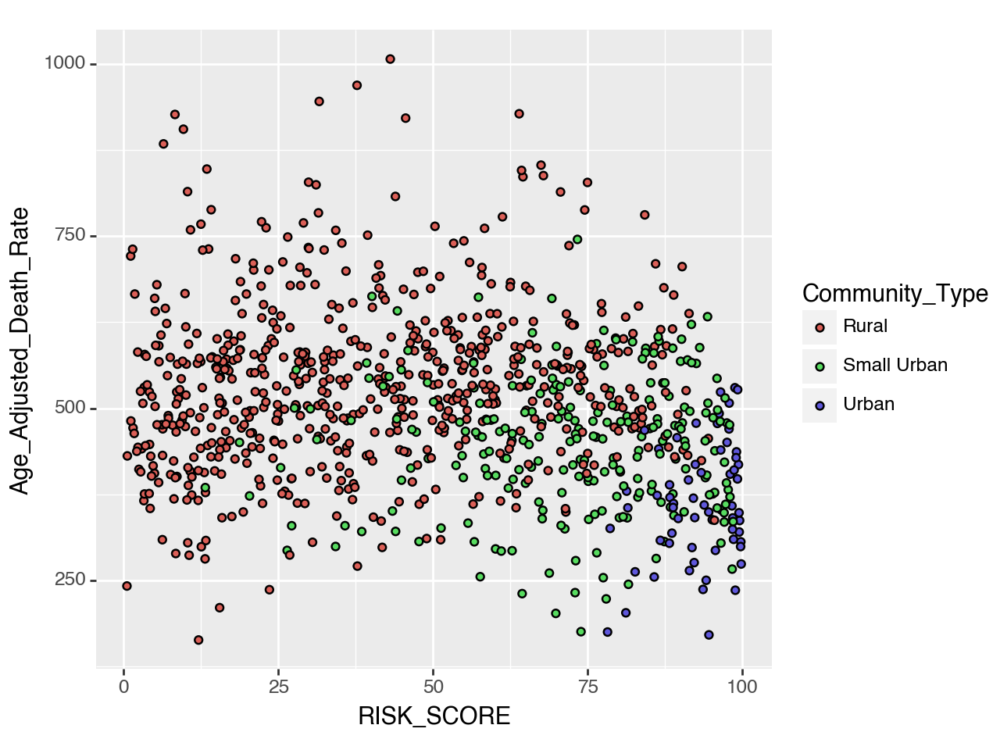

In [119]:
se_plot1 = (ggplot(NRI_county_health_data_southeast) 
 + aes(x= "RISK_SCORE", y='Age_Adjusted_Death_Rate', fill = "Community_Type") 
 + geom_point())

print(se_plot1)

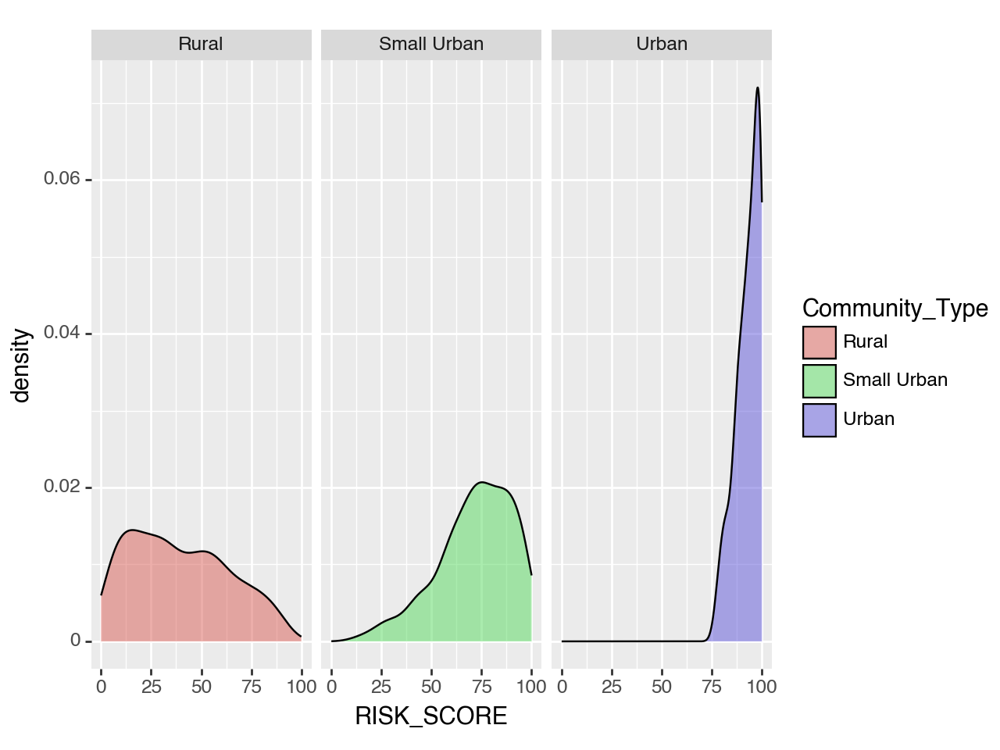

In [120]:
se_plot2 = (ggplot(NRI_county_health_data_southeast, aes(x = 'RISK_SCORE', fill="Community_Type")) +
  geom_density(color="black",alpha=.5)+
  xlim(0,100) +
  facet_grid(" ~ Community_Type"))

print(se_plot2)

/Users/holtcochran/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 2 rows containing missing values.


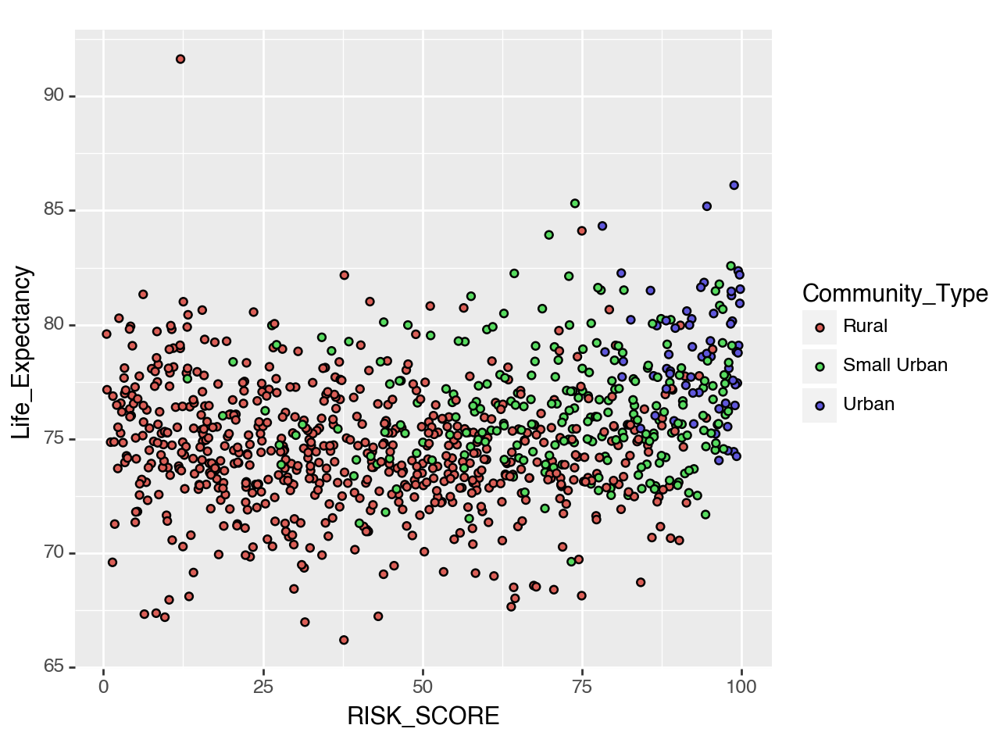

In [121]:
se_plot3 = (ggplot(NRI_county_health_data_southeast) 
 + aes(x= "RISK_SCORE", y='Life_Expectancy', fill = "Community_Type") 
 + geom_point())

print(se_plot3)

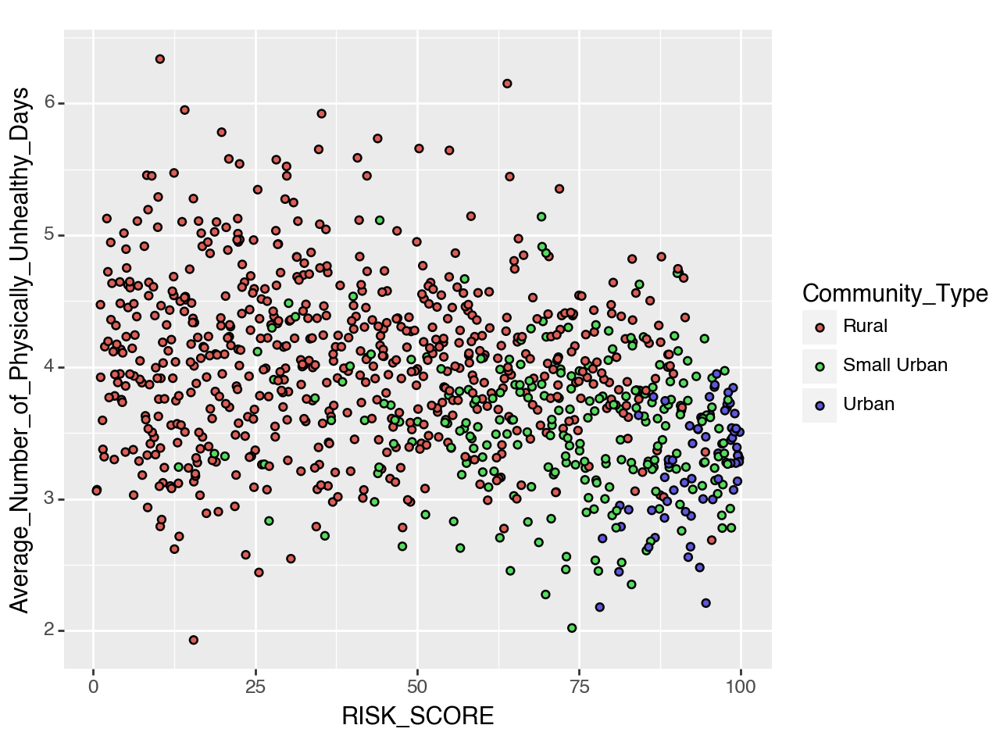

In [122]:
se_plot4 = (ggplot(NRI_county_health_data_southeast) 
 + aes(x= "RISK_SCORE", y='Average_Number_of_Physically_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

print(se_plot4)

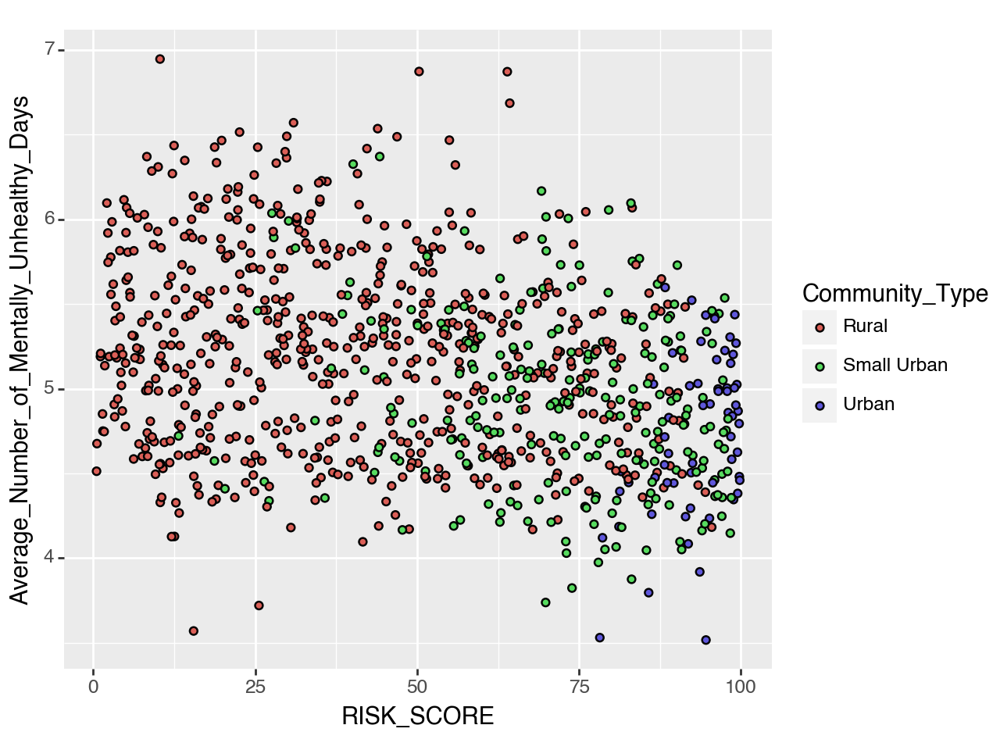

In [123]:
se_plot5 = (ggplot(NRI_county_health_data_southeast) 
 + aes(x= "RISK_SCORE", y='Average_Number_of_Mentally_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

print(se_plot5)

#### make all column names lowercase at END of code

## Machine Learning Prediction

#### Using Risk Scores to predict health outcomes

In [8]:
#cd /Users/holtcochran/PPOL5203_FinalProject/Datasets/Clean_Data

/Users/holtcochran/PPOL5203_FinalProject/Datasets/Clean_Data


In [101]:
# import data again
#NRI_county_health_data = pd.read_csv("NRI_county_health_data.csv")
#NRI_county_health_data.head()

In [102]:
# remove and replace hyphen in "age adjusted death rate" variable
#NRI_county_health_data = NRI_county_health_data.rename(columns={'Age-Adjusted_Death_Rate':'Age_Adjusted_Death_Rate'})

# remove and replace hypthen in "percent non hispanic white" variable
#NRI_county_health_data = NRI_county_health_data.rename(columns={'Percent_Non-Hispanic_White':'Percent_Non_Hispanic_White'})

In [103]:
# import packages
import numpy as np
import pandas as pd
from sklearn import datasets
from sklearn.model_selection import train_test_split    
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, mean_squared_error

### Age Adjusted Death Rate

In [104]:
# create binary column that indicates if states are above or below national average for Age Adjusted Death Rate

# AADR national average
AADR_mean = NRI_county_health_data['Age_Adjusted_Death_Rate'].mean()

# create column
NRI_county_health_data['Age_Adjusted_Death_Rate_mean_indicator'] = np.where(NRI_county_health_data['Age_Adjusted_Death_Rate'] > 
                                                                  AADR_mean, 1, 0)
NRI_county_health_data.head()

,FIPS,STATEABBRV,State,County,County_State,Community_Type,POPULATION,AREA,Population_Density,Percent_Rural,...,Age_Adjusted_Death_Rate,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non_Hispanic_White,Percent_Female,Geolocation,Age_Adjusted_Death_Rate_mean_indicator,Life_Expectancy_mean_indicator
0,1001.0,AL,Alabama,Autauga,"Autauga, AL",Small Urban,58764.0,610.470508,96.260178,42.002162,...,427.073326,10.7,16.2,23.406380,16.048735,72.454522,51.378289,POINT (-86.6464395 32.5322367),0,0
1,1003.0,AL,Alabama,Baldwin,"Baldwin, AL",Small Urban,231365.0,2047.738775,112.985603,42.279099,...,381.702031,9.9,16.1,21.218250,21.469824,83.148763,51.347715,POINT (-87.7460666 30.6592183),0,1
2,1005.0,AL,Alabama,Barbour,"Barbour, AL",Rural,25160.0,913.646511,27.538003,67.789635,...,589.566095,14.9,18.0,20.549591,19.976767,45.305240,46.703253,POINT (-85.4051035 31.8702531),1,0
3,1007.0,AL,Alabama,Bibb,"Bibb, AL",Rural,22239.0,632.486798,35.161208,68.352607,...,567.508146,12.7,17.4,20.118343,16.737109,73.564088,46.015927,POINT (-87.1271475 33.0158929),1,0
4,1009.0,AL,Alabama,Blount,"Blount, AL",Small Urban,58992.0,657.196555,89.763100,89.951502,...,532.836482,11.9,17.4,23.053471,18.725970,86.329839,50.192239,POINT (-86.56644 33.9773575),1,0


In [105]:
# features
columns = ["Community_Type", "RISK_SCORE", "Population_Density"]
X = NRI_county_health_data[columns]

# target
y = NRI_county_health_data["Age_Adjusted_Death_Rate_mean_indicator"]

In [106]:
X.isna().sum()

# no missing values

Community_Type        0
RISK_SCORE            0
Population_Density    0
dtype: int64

In [107]:
X.dtypes

# Community_Type is an object - doesn't work

Community_Type         object
RISK_SCORE            float64
Population_Density    float64
dtype: object

In [108]:
# convert Community_Type to dummy variables
# method: one-hot coding (get dummies)
# this converts categorical data into dummy variables (as many dummies as there are unique observations)
# should create 3 dummy variables for 3 community types

# Apply one-hot encoding for Community_Type nominal column
X = pd.get_dummies(X, columns=['Community_Type'], prefix='Community_Type', drop_first=False)
X

# the true/false values are dummy variables in this model

,RISK_SCORE,Population_Density,Community_Type_Rural,Community_Type_Small Urban,Community_Type_Urban
0,49.220490,96.260178,False,True,False
1,97.709195,112.985603,False,True,False
2,56.188355,27.538003,True,False,False
3,32.484887,35.161208,True,False,False
4,65.128858,89.763100,False,True,False
...,...,...,...,...,...
3138,6.617881,3.985817,True,False,False
3139,68.501432,5.457960,True,False,False
3140,21.699014,9.677509,True,False,False
3141,2.513522,3.382271,True,False,False


In [109]:
X.dtypes

# that works

RISK_SCORE                    float64
Population_Density            float64
Community_Type_Rural             bool
Community_Type_Small Urban       bool
Community_Type_Urban             bool
dtype: object

In [110]:
# split data into train and test

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.15, # is 15% okay? Or should we do 20%
                                                    random_state = 500) # I picked 500 because we have a larger datasset

In [111]:
# create model

# instantiate the modeling object
# use logistic regression because we are predicting a dummy variable
model = LogisticRegression()

# Fit the model
model.fit(X_train,y_train)

LogisticRegression()

In [112]:
# predict 
y_pred = model.predict(X_test)

# calculate MSE in the test
AADR_mse = mean_squared_error(y_test, y_pred)
AADR_mse

0.4152542372881356

## Life Exptectancy

In [113]:
# create binary column that indicates if states are above or below national average for Life Expectancy

# Life Expectancy national average
Life_Expectancy_mean = NRI_county_health_data['Life_Expectancy'].mean()

# create column
NRI_county_health_data['Life_Expectancy_mean_indicator'] = np.where(NRI_county_health_data['Life_Expectancy'] > 
                                                                  Life_Expectancy_mean, 1, 0)
NRI_county_health_data.head()

,FIPS,STATEABBRV,State,County,County_State,Community_Type,POPULATION,AREA,Population_Density,Percent_Rural,...,Age_Adjusted_Death_Rate,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non_Hispanic_White,Percent_Female,Geolocation,Age_Adjusted_Death_Rate_mean_indicator,Life_Expectancy_mean_indicator
0,1001.0,AL,Alabama,Autauga,"Autauga, AL",Small Urban,58764.0,610.470508,96.260178,42.002162,...,427.073326,10.7,16.2,23.406380,16.048735,72.454522,51.378289,POINT (-86.6464395 32.5322367),0,0
1,1003.0,AL,Alabama,Baldwin,"Baldwin, AL",Small Urban,231365.0,2047.738775,112.985603,42.279099,...,381.702031,9.9,16.1,21.218250,21.469824,83.148763,51.347715,POINT (-87.7460666 30.6592183),0,1
2,1005.0,AL,Alabama,Barbour,"Barbour, AL",Rural,25160.0,913.646511,27.538003,67.789635,...,589.566095,14.9,18.0,20.549591,19.976767,45.305240,46.703253,POINT (-85.4051035 31.8702531),1,0
3,1007.0,AL,Alabama,Bibb,"Bibb, AL",Rural,22239.0,632.486798,35.161208,68.352607,...,567.508146,12.7,17.4,20.118343,16.737109,73.564088,46.015927,POINT (-87.1271475 33.0158929),1,0
4,1009.0,AL,Alabama,Blount,"Blount, AL",Small Urban,58992.0,657.196555,89.763100,89.951502,...,532.836482,11.9,17.4,23.053471,18.725970,86.329839,50.192239,POINT (-86.56644 33.9773575),1,0


In [114]:
# features
columns = ["Community_Type", "RISK_SCORE", "Population_Density"]
X = NRI_county_health_data[columns]

# target
y = NRI_county_health_data["Life_Expectancy_mean_indicator"]

# Apply one-hot encoding for Community_Type nominal column
X = pd.get_dummies(X, columns=['Community_Type'], prefix='Community_Type', drop_first=False)
X

,RISK_SCORE,Population_Density,Community_Type_Rural,Community_Type_Small Urban,Community_Type_Urban
0,49.220490,96.260178,False,True,False
1,97.709195,112.985603,False,True,False
2,56.188355,27.538003,True,False,False
3,32.484887,35.161208,True,False,False
4,65.128858,89.763100,False,True,False
...,...,...,...,...,...
3138,6.617881,3.985817,True,False,False
3139,68.501432,5.457960,True,False,False
3140,21.699014,9.677509,True,False,False
3141,2.513522,3.382271,True,False,False


In [115]:
# split data into train and test

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.15, # is 15% okay? Or should we do 20%
                                                    random_state = 500) # I picked 500 because we have a larger datasset

In [116]:
# create model

# instantiate the modeling object
model = LogisticRegression()

# Fit the model
model.fit(X_train,y_train)

LogisticRegression()

In [117]:
# predict 
y_pred = model.predict(X_test)

# calculate MSE in the test
life_expectancy_mse = mean_squared_error(y_test, y_pred)
life_expectancy_mse

# same MSE as the age adjusted death rate and I don't know why....I've tried different things and it's the same

0.4152542372881356

## Number of Physically Unhealthy Days

In [118]:
# create binary column that indicates if states are above or below national average for Average Number of Physically
# Unhealthy Days

# Physically Unhealthy Days national average
Physically_Unhealthy_Days_mean = NRI_county_health_data['Average_Number_of_Physically_Unhealthy_Days'].mean()

# create column
NRI_county_health_data['Physically_Unhealthy_Days_mean_indicator'] = np.where(NRI_county_health_data['Average_Number_of_Physically_Unhealthy_Days'] > 
                                                                  Physically_Unhealthy_Days_mean, 1, 0)
NRI_county_health_data.head()

,FIPS,STATEABBRV,State,County,County_State,Community_Type,POPULATION,AREA,Population_Density,Percent_Rural,...,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non_Hispanic_White,Percent_Female,Geolocation,Age_Adjusted_Death_Rate_mean_indicator,Life_Expectancy_mean_indicator,Physically_Unhealthy_Days_mean_indicator
0,1001.0,AL,Alabama,Autauga,"Autauga, AL",Small Urban,58764.0,610.470508,96.260178,42.002162,...,10.7,16.2,23.406380,16.048735,72.454522,51.378289,POINT (-86.6464395 32.5322367),0,0,0
1,1003.0,AL,Alabama,Baldwin,"Baldwin, AL",Small Urban,231365.0,2047.738775,112.985603,42.279099,...,9.9,16.1,21.218250,21.469824,83.148763,51.347715,POINT (-87.7460666 30.6592183),0,1,0
2,1005.0,AL,Alabama,Barbour,"Barbour, AL",Rural,25160.0,913.646511,27.538003,67.789635,...,14.9,18.0,20.549591,19.976767,45.305240,46.703253,POINT (-85.4051035 31.8702531),1,0,1
3,1007.0,AL,Alabama,Bibb,"Bibb, AL",Rural,22239.0,632.486798,35.161208,68.352607,...,12.7,17.4,20.118343,16.737109,73.564088,46.015927,POINT (-87.1271475 33.0158929),1,0,1
4,1009.0,AL,Alabama,Blount,"Blount, AL",Small Urban,58992.0,657.196555,89.763100,89.951502,...,11.9,17.4,23.053471,18.725970,86.329839,50.192239,POINT (-86.56644 33.9773575),1,0,1


In [119]:
# features
columns = ["Community_Type", "RISK_SCORE", "Population_Density"]
X = NRI_county_health_data[columns]

# target
y = NRI_county_health_data["Physically_Unhealthy_Days_mean_indicator"]

In [120]:
# Apply one-hot encoding for Community_Type nominal column
X = pd.get_dummies(X, columns=['Community_Type'], prefix='Community_Type', drop_first=False)

In [121]:
# split data into train and test

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.15, # is 15% okay? Or should we do 20%
                                                    random_state = 500) # I picked 500 because we have a larger datasset

In [122]:
# create model

# instantiate the modeling object
model_ols = LogisticRegression()

# Fit the model
model_ols.fit(X_train,y_train)

LogisticRegression()

In [123]:
# predict 
y_pred = model.predict(X_test)

# calculate MSE in the test
physically_unhealthy_mse = mean_squared_error(y_test, y_pred)
physically_unhealthy_mse

0.5953389830508474

## Number of Mentally Unhealthy Days

In [124]:
# create binary column that indicates if states are above or below national average for Average Number of Mentally
# Unhealthy Days

# national average
Mentally_Unhealthy_Days_mean = NRI_county_health_data['Average_Number_of_Mentally_Unhealthy_Days'].mean()

# create column
NRI_county_health_data['Mentally_Unhealthy_Days_mean_indicator'] = np.where(NRI_county_health_data['Average_Number_of_Mentally_Unhealthy_Days'] > 
                                                                  Mentally_Unhealthy_Days_mean, 1, 0)

In [125]:
# features
columns = ["Community_Type", "RISK_SCORE", "Population_Density"]
X = NRI_county_health_data[columns]

# target
y = NRI_county_health_data["Mentally_Unhealthy_Days_mean_indicator"]

In [126]:
# Apply one-hot encoding for Community_Type nominal column
X = pd.get_dummies(X, columns=['Community_Type'], prefix='Community_Type', drop_first=False)

In [127]:
# split data into train and test

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.15, # is 15% okay? Or should we do 20%
                                                    random_state = 500) # I picked 500 because we have a larger datasset

In [128]:
# create model

# instantiate the modeling object
model = LogisticRegression()

# Fit the model
mentally_unhealthy_model = model.fit(X_train,y_train)

In [129]:
# predict 
y_pred = model.predict(X_test)

# calculate MSE in the test
mentally_unhealthy_mse = mean_squared_error(y_test, y_pred)
mentally_unhealthy_mse

0.4639830508474576

# Machine Learning Model Visualizations

In [130]:
#pip install --upgrade scikit-learn

In [131]:
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.metrics import precision_recall_curve, auc
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import confusion_matrix #, plot_confusion_matrix
#from sklearn.metrics import plot_confusion_matrix

## Mentally Unhealthy Days model evaluations

In [132]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print the evaluation metrics
print(f"Accuracy: {accuracy:.2f}")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

Accuracy: 0.54
Confusion Matrix:
[[ 98 121]
 [ 98 155]]
Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.45      0.47       219
           1       0.56      0.61      0.59       253

    accuracy                           0.54       472
   macro avg       0.53      0.53      0.53       472
weighted avg       0.53      0.54      0.53       472



### Receiver Operating Characteristic (ROC) curve

ROC curves show the relationship (tradeoff) between true positive and false positive predicted values. The closer the ROC curve area is to 1.0, the more accurate the model is. More here: https://en.wikipedia.org/wiki/Receiver_operating_characteristic

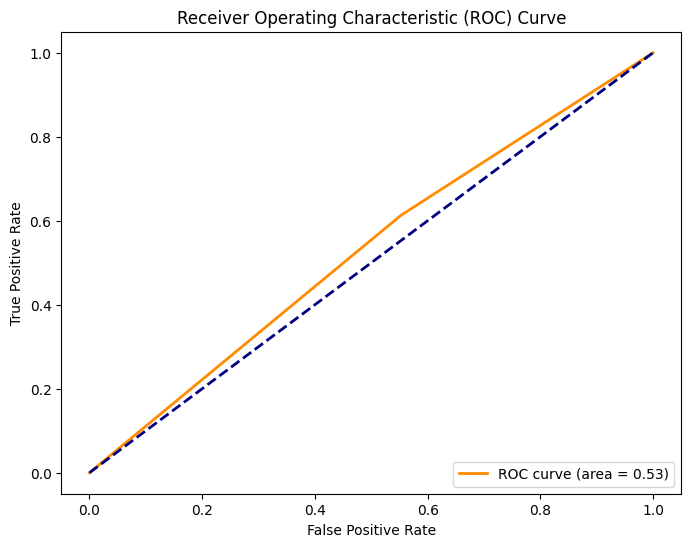

In [133]:
from sklearn.metrics import roc_curve, auc

# Receiver Operating Characteristic (ROC) curve
fpr, tpr, _ = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)

# Plot curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


# 0.53 means the model is not very good at predicting outcomes

### Confusion Matrix

Shows the accuracy of our model's predicted values against the test data. Groups the predicted values into True True, True False, False False, and False True. Basically, shows our type 1 and type 2 errors in predicting values.
The model does not have many true true values, which isn't good. More here: https://towardsdatascience.com/understanding-confusion-matrix-a9ad42dcfd62

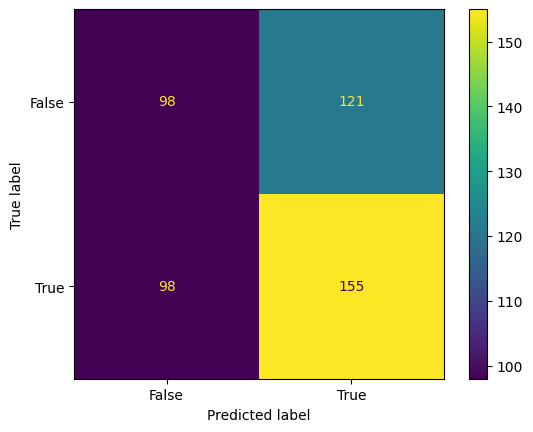

In [134]:
# create confusion matrix
confusion_matrix = metrics.confusion_matrix(y_test, y_pred)

# display it
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

The models need work to become more accurate. I will work on cross-validation tomorrow. 

# Cross Validation Techniques

Going to use k-folds because I think it makes the most sense for this project and analysis

## Age Adjusted Death Rate

In [135]:
from sklearn.model_selection import train_test_split # Train-test split
from sklearn.model_selection import cross_val_score, KFold
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

### K-Fold

In [136]:
# features
columns = ["Community_Type", "RISK_SCORE", "Population_Density"]
X = NRI_county_health_data[columns]

# target
y = NRI_county_health_data["Age_Adjusted_Death_Rate_mean_indicator"]

In [137]:
# Apply one-hot encoding for Community_Type nominal column
X = pd.get_dummies(X, columns=['Community_Type'], prefix='Community_Type', drop_first=False)

In [138]:
# scale the variables - may improve accuracy
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [139]:
# instantiate the modeling object
model = LogisticRegression()

In [140]:
# number of folds
k_folds = 10  

# split the data into folds
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

In [141]:
# accuracy scores of each fold
scores = cross_val_score(model, X_scaled, y, cv=kf, scoring='accuracy')


In [142]:
print(f'Mean Accuracy: {np.mean(scores):.4f}')
print(f'Standard Deviation: {np.std(scores):.4f}')

Mean Accuracy: 0.6023
Standard Deviation: 0.0192


#### Plots

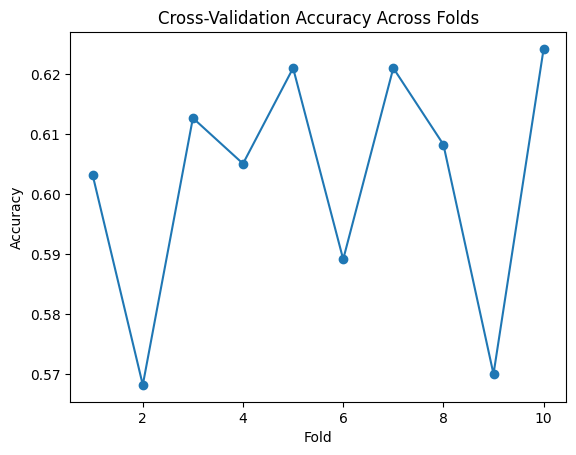

In [143]:
plt.plot(np.arange(1, k_folds + 1), scores, marker='o')
plt.xlabel('Fold')
plt.ylabel('Accuracy')
plt.title('Cross-Validation Accuracy Across Folds')
plt.show()

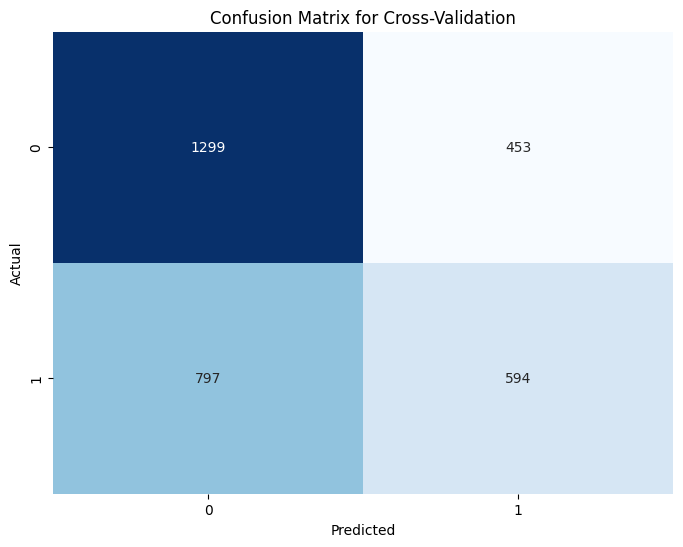

In [144]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix
import seaborn as sns

predictions = cross_val_predict(model, X_scaled, y, cv=kf)
cm = confusion_matrix(y, predictions)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Cross-Validation')
plt.show()

# we want a lot of 1:1

#### ROC Curve

In [145]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

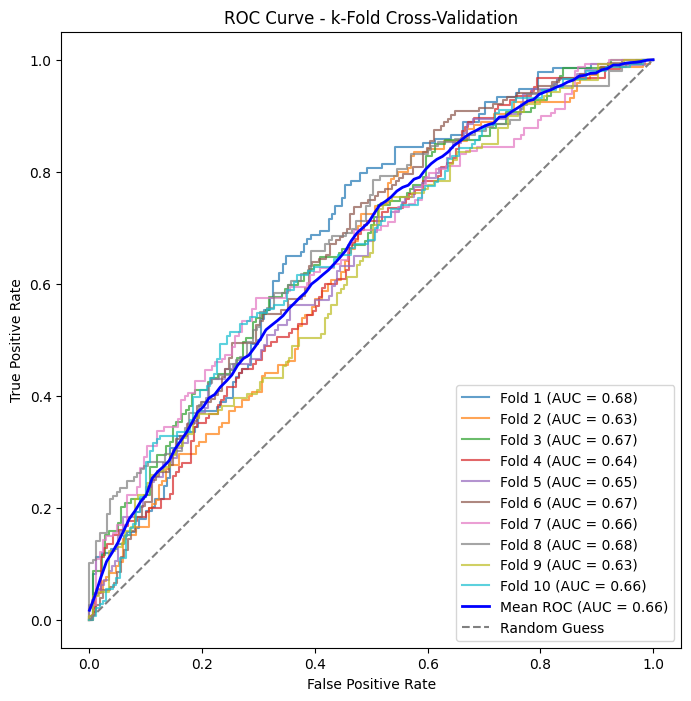

In [146]:
y_probabilities = cross_val_predict(model, X_scaled, y, cv=kf, method='predict_proba')

# Compute ROC curve and AUC for each fold
mean_fpr = np.linspace(0, 1, 100)
tpr_list = []

plt.figure(figsize=(8, 8))

for i, (train, test) in enumerate(kf.split(X_scaled, y)):
    model.fit(X_scaled[train], y[train])
    fpr, tpr, thresholds = roc_curve(y[test], y_probabilities[test][:, 1])
    tpr_list.append(np.interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Fold {i+1} (AUC = {roc_auc:.2f})', alpha=0.7)

# Plot the mean ROC curve
mean_tpr = np.mean(tpr_list, axis=0)
mean_auc = auc(mean_fpr, mean_tpr)

plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC (AUC = {mean_auc:.2f})', linewidth=2)

# Plot the diagonal line for reference
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')

# Customize the plot
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - k-Fold Cross-Validation')
plt.legend()
plt.show()

The AUC is a lot higher (up to about 0.66 from 0.53). We can use this now and be more confident in our predictions

## Life Expectancy

### K-Fold

In [147]:
# features
columns = ["Community_Type", "RISK_SCORE", "Population_Density"]
X = NRI_county_health_data[columns]

# target
y = NRI_county_health_data["Life_Expectancy_mean_indicator"]

# Apply one-hot encoding for Community_Type nominal column
X = pd.get_dummies(X, columns=['Community_Type'], prefix='Community_Type', drop_first=False)

In [148]:
# scale the variables - may improve accuracy
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [149]:
# instantiate the modeling object
model = LogisticRegression()

In [150]:
# number of folds
k_folds = 10  

# split the data into folds
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

In [151]:
# accuracy scores of each fold
scores = cross_val_score(model, X_scaled, y, cv=kf, scoring='accuracy')

In [152]:
print(f'Mean Accuracy: {np.mean(scores):.4f}')
print(f'Standard Deviation: {np.std(scores):.4f}')

Mean Accuracy: 0.5756
Standard Deviation: 0.0211


### Plots

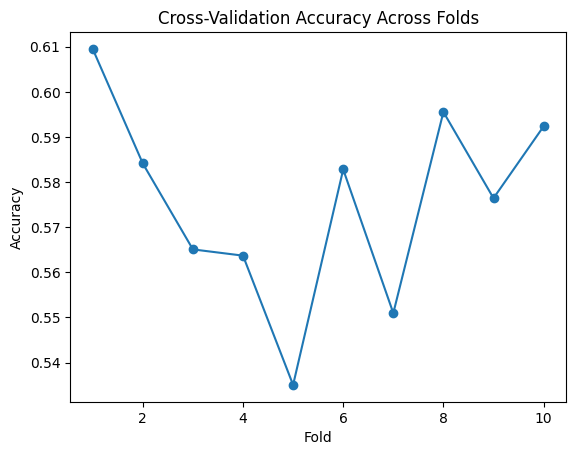

In [153]:
plt.plot(np.arange(1, k_folds + 1), scores, marker='o')
plt.xlabel('Fold')
plt.ylabel('Accuracy')
plt.title('Cross-Validation Accuracy Across Folds')
plt.show()

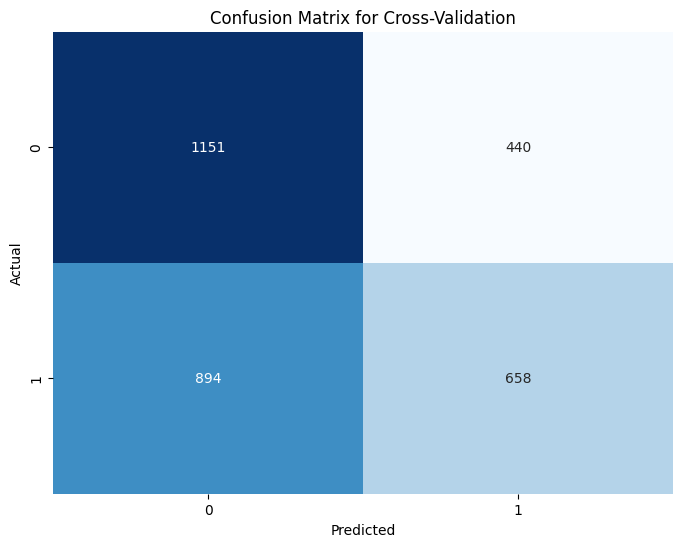

In [154]:
predictions = cross_val_predict(model, X_scaled, y, cv=kf)
cm = confusion_matrix(y, predictions)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Cross-Validation')
plt.show()

# we want a lot of 1:1

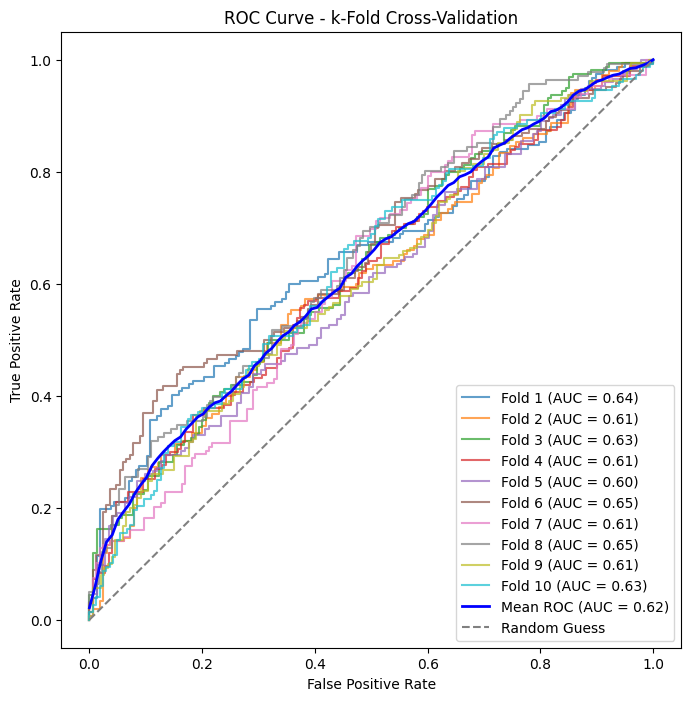

In [155]:
y_probabilities = cross_val_predict(model, X_scaled, y, cv=kf, method='predict_proba')

# Compute ROC curve and AUC for each fold
mean_fpr = np.linspace(0, 1, 100)
tpr_list = []

plt.figure(figsize=(8, 8))

for i, (train, test) in enumerate(kf.split(X_scaled, y)):
    model.fit(X_scaled[train], y[train])
    fpr, tpr, thresholds = roc_curve(y[test], y_probabilities[test][:, 1])
    tpr_list.append(np.interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Fold {i+1} (AUC = {roc_auc:.2f})', alpha=0.7)

# Plot the mean ROC curve
mean_tpr = np.mean(tpr_list, axis=0)
mean_auc = auc(mean_fpr, mean_tpr)

plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC (AUC = {mean_auc:.2f})', linewidth=2)

# Plot the diagonal line for reference
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')

# Customize the plot
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - k-Fold Cross-Validation')
plt.legend()
plt.show()

## Physically Unhealthy Days

### K-Folds

In [156]:
# features
columns = ["Community_Type", "RISK_SCORE", "Population_Density"]
X = NRI_county_health_data[columns]

# target
y = NRI_county_health_data["Physically_Unhealthy_Days_mean_indicator"]

# Apply one-hot encoding for Community_Type nominal column
X = pd.get_dummies(X, columns=['Community_Type'], prefix='Community_Type', drop_first=False)

In [157]:
# scale the variables - may improve accuracy
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [158]:
# instantiate the modeling object
model = LogisticRegression()

In [159]:
# number of folds
k_folds = 10  

# split the data into folds
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

In [160]:
# accuracy scores of each fold
scores = cross_val_score(model, X_scaled, y, cv=kf, scoring='accuracy')

In [161]:
print(f'Mean Accuracy: {np.mean(scores):.4f}')
print(f'Standard Deviation: {np.std(scores):.4f}')

Mean Accuracy: 0.5937
Standard Deviation: 0.0214


### Plots

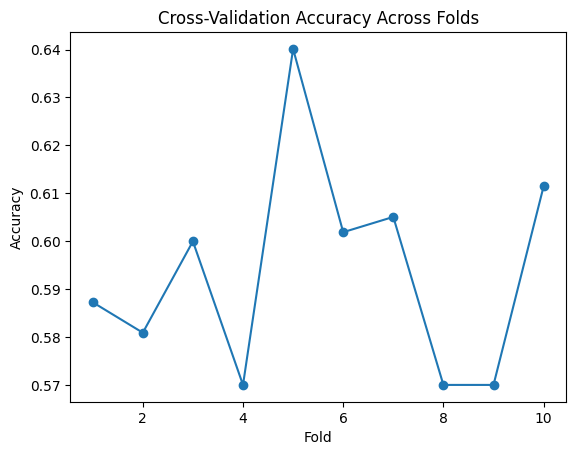

In [162]:
plt.plot(np.arange(1, k_folds + 1), scores, marker='o')
plt.xlabel('Fold')
plt.ylabel('Accuracy')
plt.title('Cross-Validation Accuracy Across Folds')
plt.show()

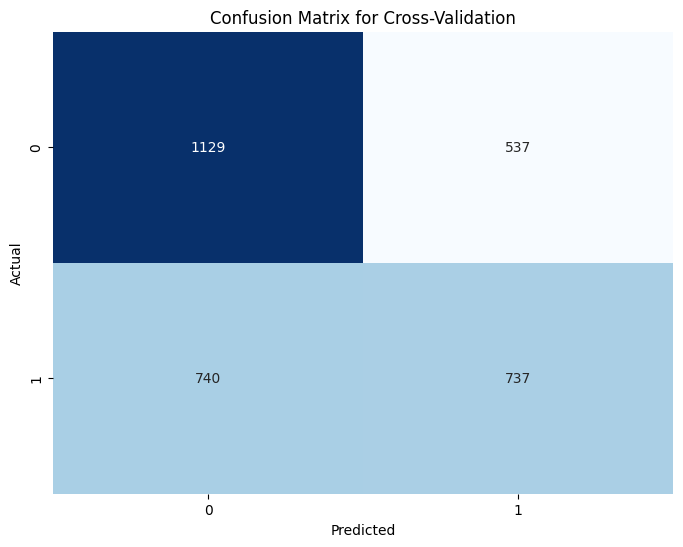

In [163]:
predictions = cross_val_predict(model, X_scaled, y, cv=kf)
cm = confusion_matrix(y, predictions)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Cross-Validation')
plt.show()

# we want a lot of 1:1

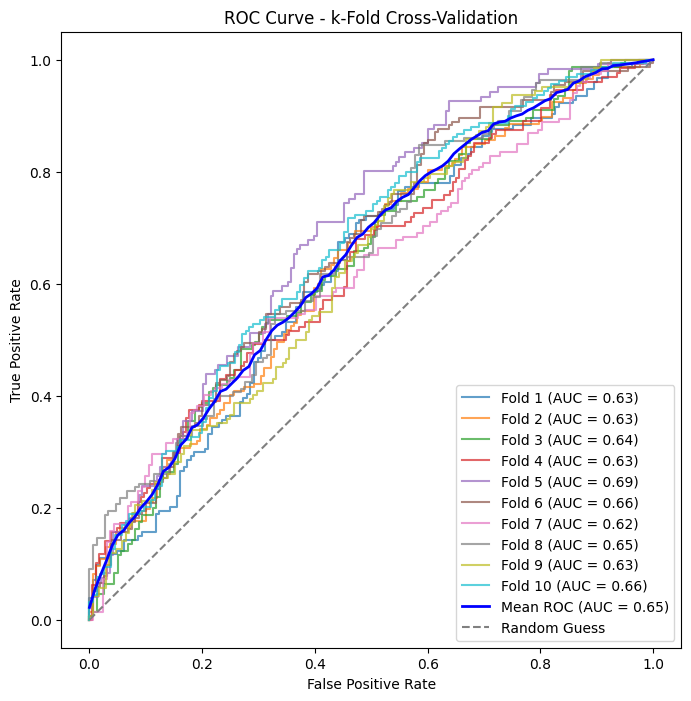

In [164]:
y_probabilities = cross_val_predict(model, X_scaled, y, cv=kf, method='predict_proba')

# Compute ROC curve and AUC for each fold
mean_fpr = np.linspace(0, 1, 100)
tpr_list = []

plt.figure(figsize=(8, 8))

for i, (train, test) in enumerate(kf.split(X_scaled, y)):
    model.fit(X_scaled[train], y[train])
    fpr, tpr, thresholds = roc_curve(y[test], y_probabilities[test][:, 1])
    tpr_list.append(np.interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Fold {i+1} (AUC = {roc_auc:.2f})', alpha=0.7)

# Plot the mean ROC curve
mean_tpr = np.mean(tpr_list, axis=0)
mean_auc = auc(mean_fpr, mean_tpr)

plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC (AUC = {mean_auc:.2f})', linewidth=2)

# Plot the diagonal line for reference
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')

# Customize the plot
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - k-Fold Cross-Validation')
plt.legend()
plt.show()

## Mentally Unhealthy Days

### K Folds

In [166]:
# features
columns = ["Community_Type", "RISK_SCORE", "Population_Density"]
X = NRI_county_health_data[columns]

# target
y = NRI_county_health_data["Mentally_Unhealthy_Days_mean_indicator"]


# Apply one-hot encoding for Community_Type nominal column
X = pd.get_dummies(X, columns=['Community_Type'], prefix='Community_Type', drop_first=False)

In [167]:
# scale the variables - may improve accuracy
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
# instantiate the modeling object
model = LogisticRegression()

In [ ]:
# number of folds
k_folds = 10  

# split the data into folds
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

In [ ]:
# accuracy scores of each fold
scores = cross_val_score(model, X_scaled, y, cv=kf, scoring='accuracy')

In [ ]:
print(f'Mean Accuracy: {np.mean(scores):.4f}')
print(f'Standard Deviation: {np.std(scores):.4f}')

### Plots

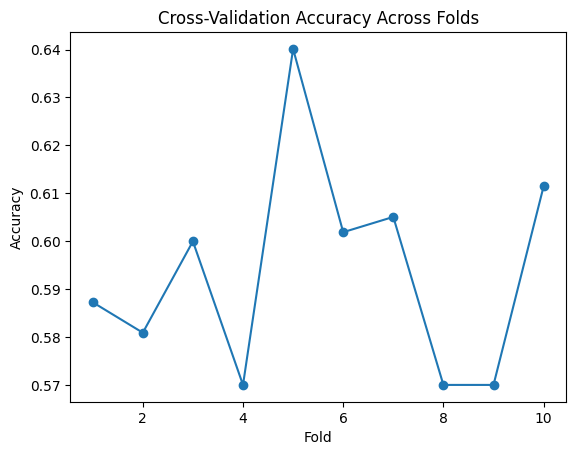

In [168]:
plt.plot(np.arange(1, k_folds + 1), scores, marker='o')
plt.xlabel('Fold')
plt.ylabel('Accuracy')
plt.title('Cross-Validation Accuracy Across Folds')
plt.show()

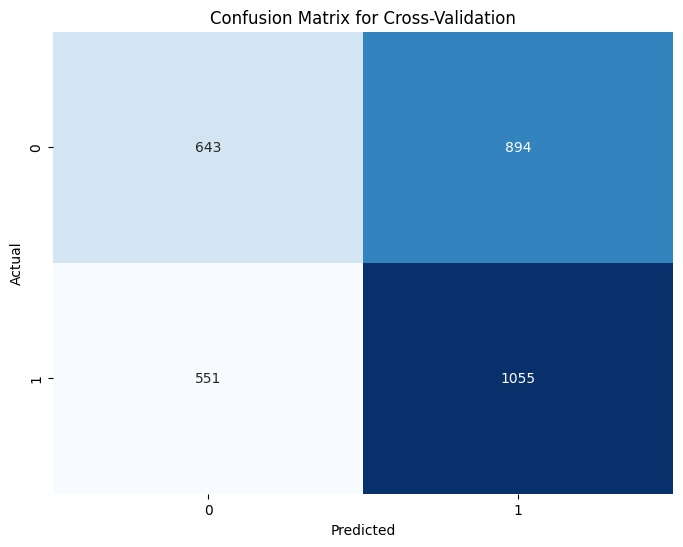

In [169]:
predictions = cross_val_predict(model, X_scaled, y, cv=kf)
cm = confusion_matrix(y, predictions)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Cross-Validation')
plt.show()

# we want a lot of 1:1

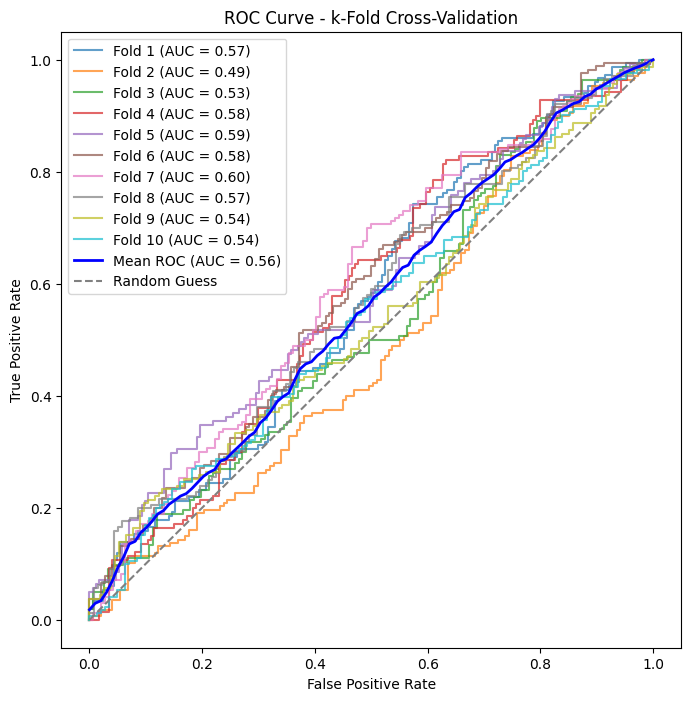

In [170]:
y_probabilities = cross_val_predict(model, X_scaled, y, cv=kf, method='predict_proba')

# Compute ROC curve and AUC for each fold
mean_fpr = np.linspace(0, 1, 100)
tpr_list = []

plt.figure(figsize=(8, 8))

for i, (train, test) in enumerate(kf.split(X_scaled, y)):
    model.fit(X_scaled[train], y[train])
    fpr, tpr, thresholds = roc_curve(y[test], y_probabilities[test][:, 1])
    tpr_list.append(np.interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Fold {i+1} (AUC = {roc_auc:.2f})', alpha=0.7)

# Plot the mean ROC curve
mean_tpr = np.mean(tpr_list, axis=0)
mean_auc = auc(mean_fpr, mean_tpr)

plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC (AUC = {mean_auc:.2f})', linewidth=2)

# Plot the diagonal line for reference
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')

# Customize the plot
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - k-Fold Cross-Validation')
plt.legend()
plt.show()

## Analysis:

Using k-fold cross validation improved the accuracy of the models by about 10%. Still not a great predictor, but it is a lot better and we should actually be able to use the models now.